In [1]:
# conda base or bioem

# Data manipulation 
import pandas as pd 
import numpy as np

# Data viz
import matplotlib.pyplot as plt 
from matplotlib.patches import Patch
import seaborn as sns
import plotly.express as px

# regression algorithm
from sklearn.svm import NuSVR

# ML
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score  
from scipy.stats import spearmanr, pearsonr
import joblib

# load data 

In [5]:
# load data without the extreme values
df = pd.read_pickle("../results/mics/training_dset_mics_clean.pkl")

# select sbls
df = df[df.bla_class.str.contains("Class A|Class C|Class D")]
df_a = df[df.bla_class.str.contains("Class A")]
df_c = df[df.bla_class.str.contains("Class C")]
df_d = df[df.bla_class.str.contains("Class D")]

# take a subset of the whole df with the most important data for training purposes
df = df[['protein_name', 'protein_family_header', 'bla_class', 'antibiotic', 'antibiotic_class', 'fold','log2_fold', 't5bfd']]

# enlist the antibiotic data per each bla class
uniq_anti_a = df_a.antibiotic.unique().tolist()
uniq_anti_c = df_c.antibiotic.unique().tolist()
uniq_anti_d = df_d.antibiotic.unique().tolist()
uniq_anti   = df.antibiotic.unique().tolist()

df.head()

,protein_name,protein_family_header,bla_class,antibiotic,antibiotic_class,fold,log2_fold,t5bfd
0,SFO-1,SFO,Class A,Amoxicillin,Penicillins,256.0,8.0,"[0.0176283, 0.018968944, -0.04833036, 0.040485..."
1,SFO-1,SFO,Class A,Amoxicillin-CLA,Penicillins,128.0,7.0,"[0.0176283, 0.018968944, -0.04833036, 0.040485..."
2,SFO-1,SFO,Class A,Ceftazidime,Cephalosporins,128.0,7.0,"[0.0176283, 0.018968944, -0.04833036, 0.040485..."
3,SFO-1,SFO,Class A,Piperacillin,Penicillins,512.0,9.0,"[0.0176283, 0.018968944, -0.04833036, 0.040485..."
4,SFO-1,SFO,Class A,Imipenem,Carbapenems,2.0,1.0,"[0.0176283, 0.018968944, -0.04833036, 0.040485..."


In [6]:
# set antibiotic classes
penicillins = ["Amoxicillin","Ticarcillin","Piperacillin", "Piperacillin-TZB",
               "Amoxicillin-CLA","Ampicillin","Ticarcillin-CLA"]

cephalosporins = ["Cephalothin","Cefuroxime","Cefoxitin", "Ceftazidime", "Ceftriaxone","Cefotaxime",
                  "Ceftazidime-CLA", "Cefotaxime-CLA", "Cefepime", "Cefpirome"]

carbapenems = ["Imipenem","Meropenem"]

monobactams = ["Aztreonam","Moxalactam"]

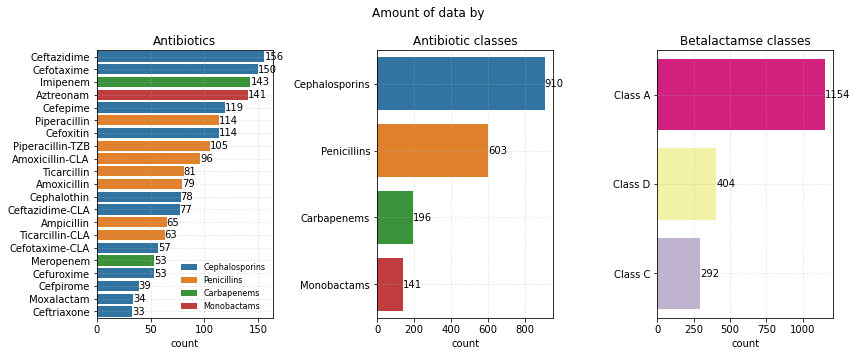

In [7]:
# plots
fig, axs = plt.subplots(nrows = 1, ncols = 3, figsize = (12, 5))

# fold
sns.countplot(data = df, y = "antibiotic", hue = "antibiotic_class", dodge = False, 
              order = pd.value_counts(df.antibiotic).index, ax = axs[0],
             hue_order=["Cephalosporins","Penicillins","Carbapenems","Monobactams"])
axs[0].set_title("Antibiotics")
axs[0].set_ylabel("")
axs[0].legend(prop = {"size":8}, frameon= False)
axs[0].grid(alpha = 0.3, linestyle = "--")
for ele in [0,1,2,3]:
    axs[0].bar_label(axs[0].containers[ele])


# log2_fold
sns.countplot(data = df, y = "antibiotic_class", ax = axs[1], order = pd.value_counts(df.antibiotic_class).index)
axs[1].set_title("Antibiotic classes")
axs[1].grid(alpha = 0.3, linestyle = "--")
axs[1].set_ylabel("")
axs[1].bar_label(axs[1].containers[0])


# bla_class
sns.countplot(data = df, y = "bla_class", ax = axs[2], order = pd.value_counts(df.bla_class).index, palette="Accent_r")
axs[2].set_title("Betalactamse classes")
axs[2].grid(alpha = 0.3, linestyle = "--")
axs[2].set_ylabel("")
axs[2].bar_label(axs[2].containers[0])

plt.suptitle("Amount of data by")
plt.tight_layout()
plt.show()

<AxesSubplot:xlabel='log2_fold', ylabel='antibiotic'>

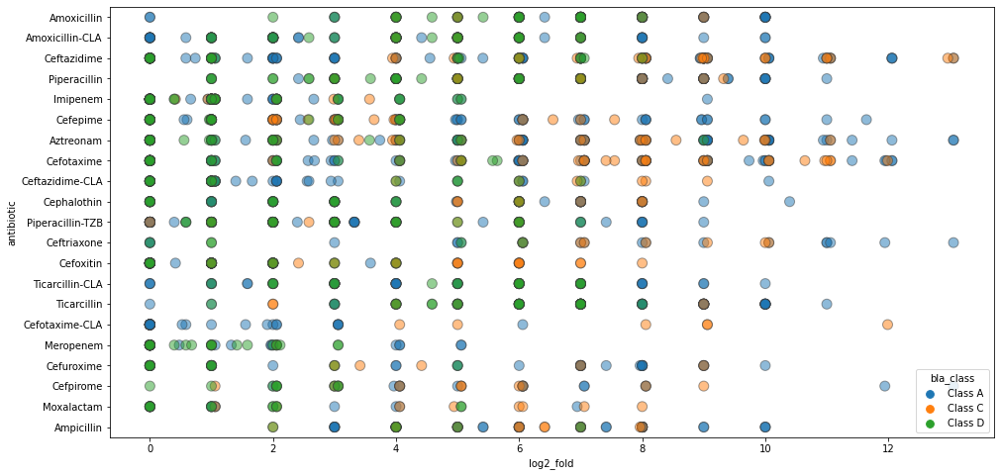

In [8]:
plt.figure(figsize=(16,8))
sns.stripplot(data=df, y="antibiotic", x="log2_fold", hue="bla_class", 
              jitter=False, s=10,  linewidth=1, alpha=.5,
         )

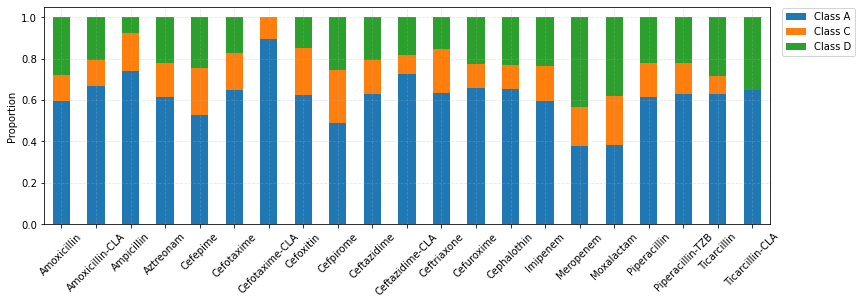

In [10]:
prop_df = df.groupby('antibiotic')['bla_class'].value_counts(normalize=True).unstack()
prop_cumsum = prop_df.cumsum(axis=1)
prop_df.plot(kind='bar', stacked=True, figsize=(13,4))
plt.xlabel('Antibiotic')
plt.ylabel('Proportion')
#plt.title('Proportion of bla_class by Antibiotic')
plt.legend(title='bla_class')
plt.xlabel("")
plt.xticks(rotation = 45)
plt.grid(alpha = 0.3, linestyle = "--")
plt.legend(bbox_to_anchor=(1.01, 1.02), loc="upper left");

Here we're dealing with a complicated scenario for doing an ideal regression model, because we have the next conditions:
- small data size (per antibiotic, in special for Moxalactam or Ceftriaxone)
- imbalanced dataset (taking into acount the betalactamase classes)

To deal with this data, we will need to use an cross validation strategy (shuffling the data) to properly train our models. More info at: 
- https://youtu.be/-8s9KuNo5SA?t=1171 
- https://scikit-learn.org/stable/modules/cross_validation.html
- https://youtu.be/NmXBr6gfUkA
- https://youtu.be/efR1C6CvhmE 
- https://stats.stackexchange.com/questions/405624/difference-between-cross-validation-gridsearchcv-and-does-cross-validation-refer 
- https://towardsdatascience.com/ensuring-that-your-machine-learning-algorithms-make-accurate-predictions-dc98648d68fa 
- https://queirozf.com/entries/scikit-learn-pipeline-examples#cross-validation-cross_val_score 
- https://coderzcolumn.com/tutorials/machine-learning/support-vector-machine-svm#5 
- https://medium.com/@myselfaman12345/c-and-gamma-in-svm-e6cee48626be
- https://www.quora.com/What-are-C-and-gamma-with-regards-to-a-support-vector-machine 
- https://scikit-learn.org/stable/auto_examples/svm/plot_rbf_parameters.html

By far, the best post:
- https://towardsdatascience.com/7-of-the-most-commonly-used-regression-algorithms-and-how-to-choose-the-right-one-fc3c8890f9e3
- https://towardsdatascience.com/7-of-the-most-commonly-used-regression-algorithms-and-how-to-choose-the-right-one-fc3c8890f9e3?gi=30cbb1e146f3
- https://youtu.be/NYwVM6_EuxQ 
- https://vitalflux.com/svm-rbf-kernel-parameters-code-sample/#:~:text=Let's%20take%20a%20look%20at,the%20kernel%20%3D%20'rbf'.

Nonetheless, there will always a bias in the dataset that can be account for the type of protein family with the data correspond, or even the taxonomy of each of the sequences. 

For this purpose we need to follow the nex steps (based on [this post](https://towardsdatascience.com/how-to-do-cross-validation-effectively-1bbeb1d69ee8)):
1. Split the data into training and testing sets;
2. Apply cross-validation with the training set to select a model;
3. Re-train the chosen model using the training data and evaluate it on the test set. This provides you with an unbiased performance estimate;
4. Re-train the chosen model using all available data and deploy it.

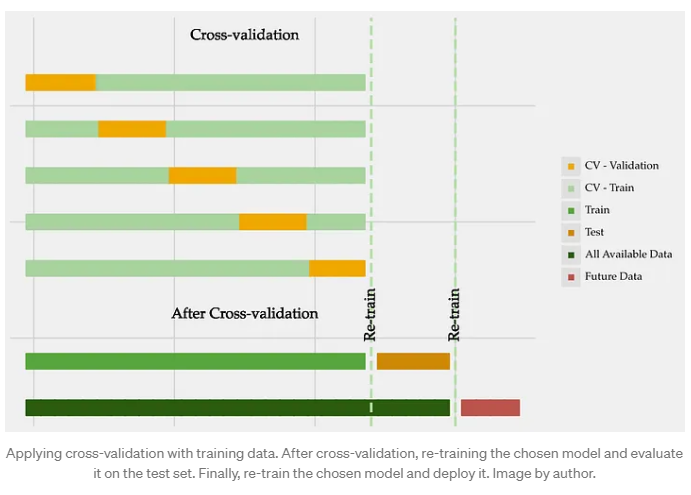

https://stackoverflow.com/questions/63882885/do-we-evaluate-accuracy-on-cross-val-score-and-then-evaluate-accuracy-on-test-da
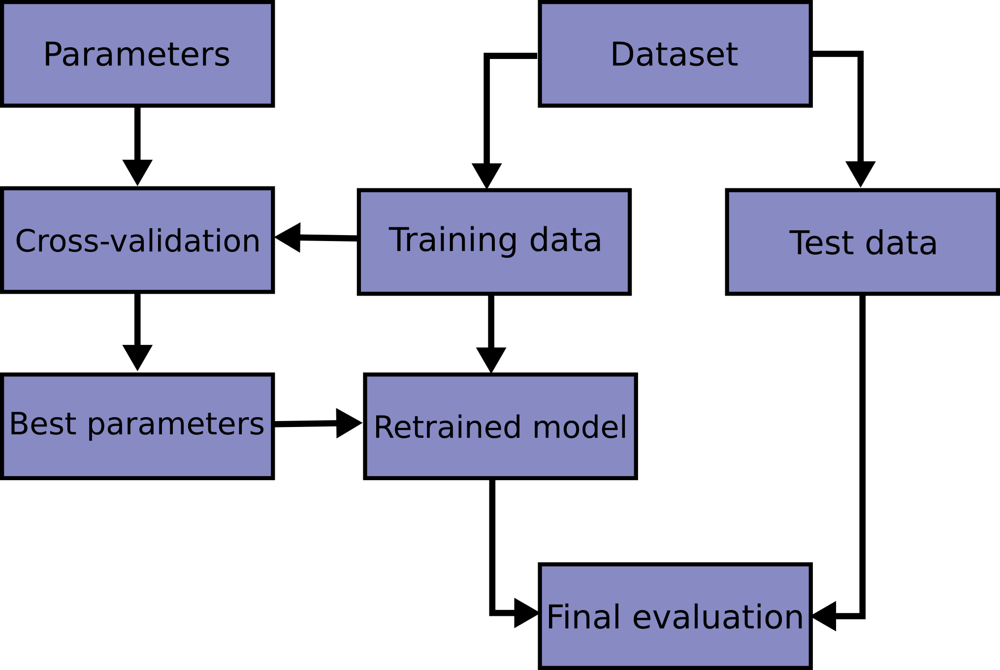

# Traininig 

## all antibiotics

In [10]:
# ! mkdir /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim

🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Amoxicillin using Prot-T5-BFD


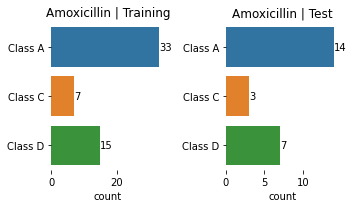

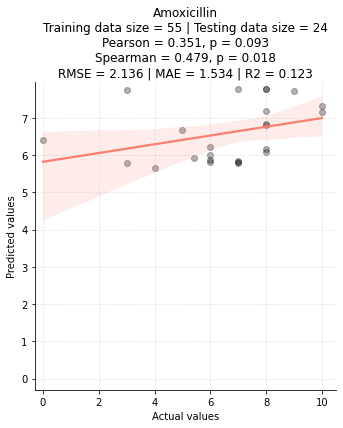

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Amoxicillin.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Amoxicillin-CLA using Prot-T5-BFD


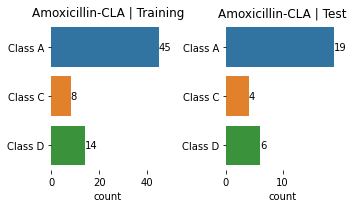

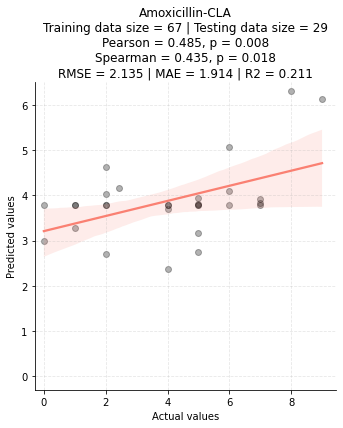

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Amoxicillin-CLA.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Ceftazidime using Prot-T5-BFD


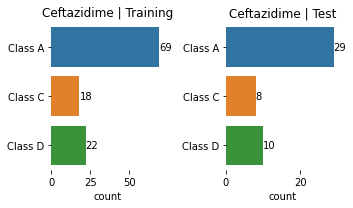

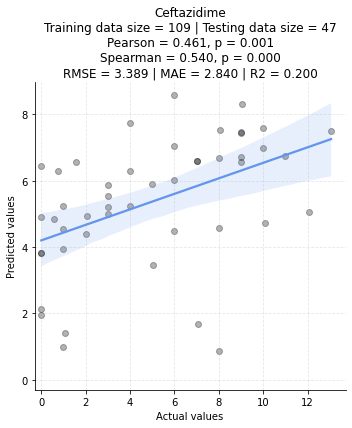

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Ceftazidime.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Piperacillin using Prot-T5-BFD


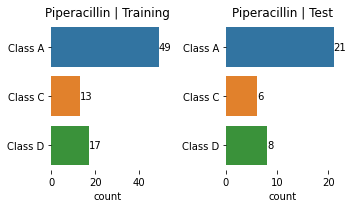

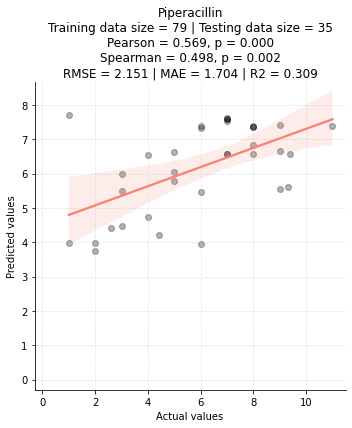

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Piperacillin.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Imipenem using Prot-T5-BFD


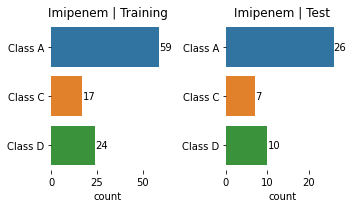

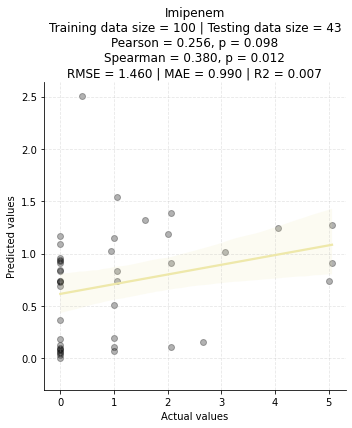

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Imipenem.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Cefepime using Prot-T5-BFD


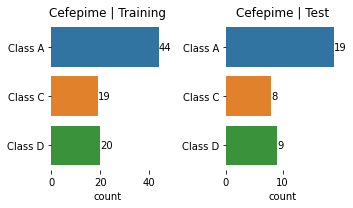

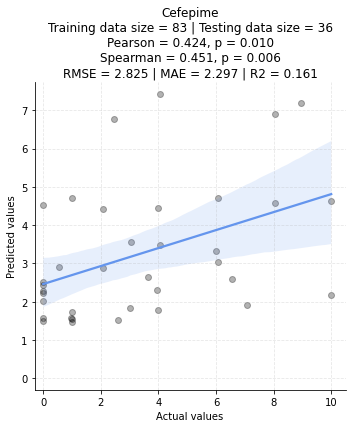

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Cefepime.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Aztreonam using Prot-T5-BFD


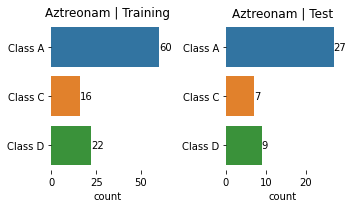

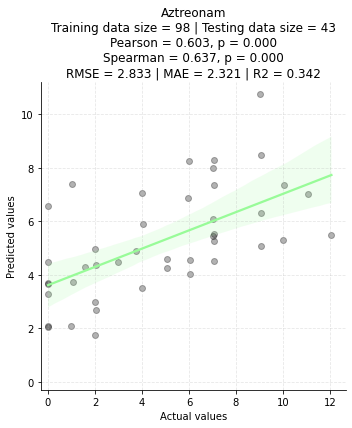

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Aztreonam.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Cefotaxime using Prot-T5-BFD


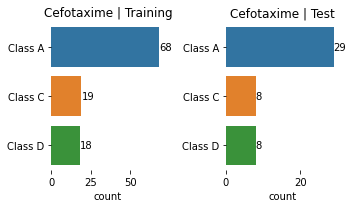

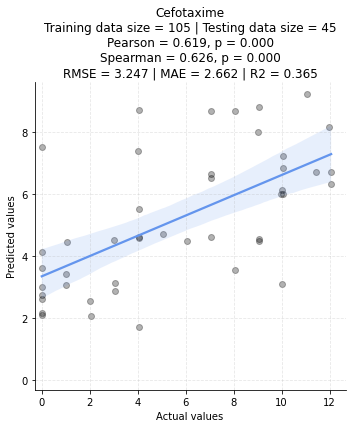

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Cefotaxime.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Ceftazidime-CLA using Prot-T5-BFD


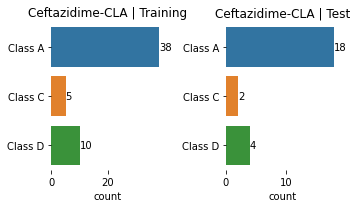

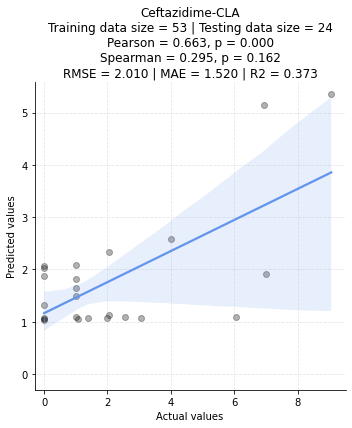

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Ceftazidime-CLA.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Cephalothin using Prot-T5-BFD


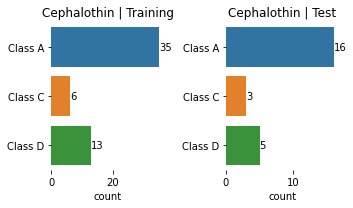

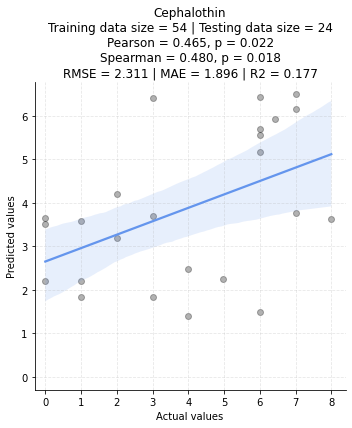

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Cephalothin.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Piperacillin-TZB using Prot-T5-BFD


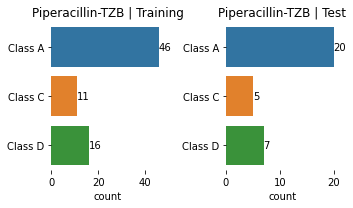

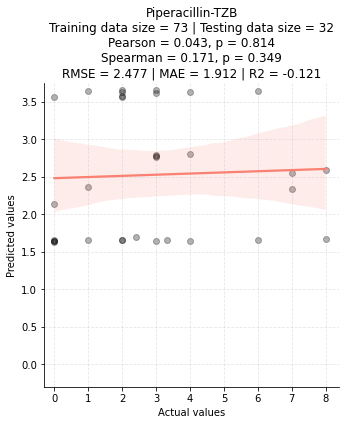

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Piperacillin-TZB.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Ceftriaxone using Prot-T5-BFD


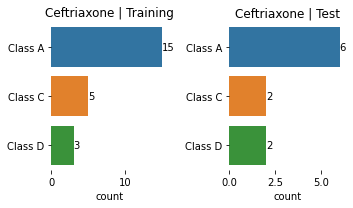

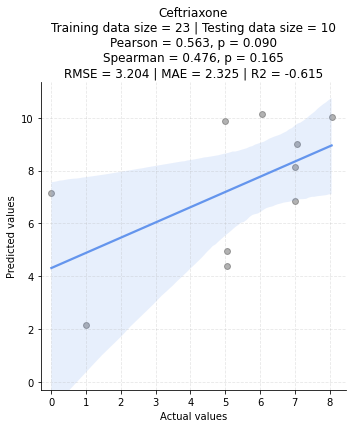

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Ceftriaxone.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Cefoxitin using Prot-T5-BFD


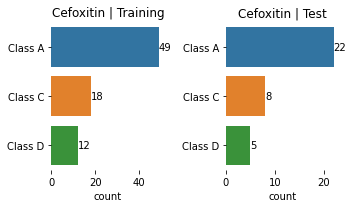

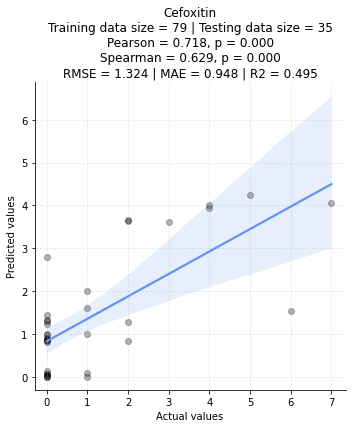

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Cefoxitin.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Ticarcillin-CLA using Prot-T5-BFD


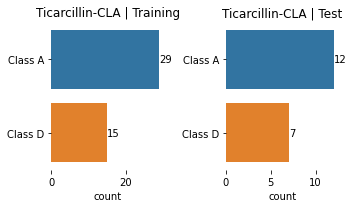

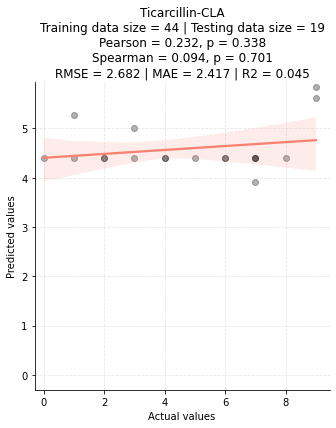

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Ticarcillin-CLA.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Ticarcillin using Prot-T5-BFD


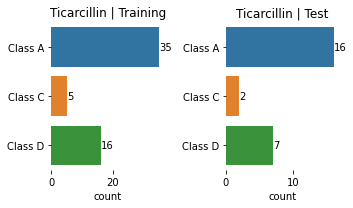

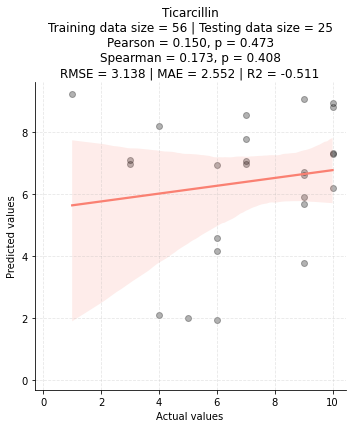

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Ticarcillin.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Cefotaxime-CLA using Prot-T5-BFD


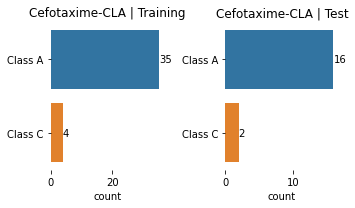

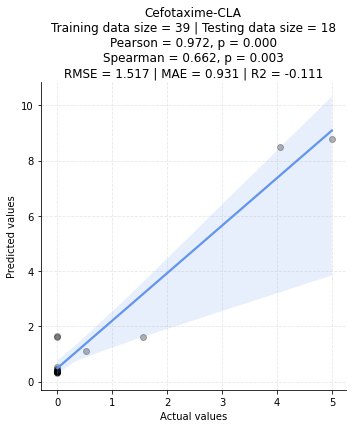

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Cefotaxime-CLA.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Meropenem using Prot-T5-BFD


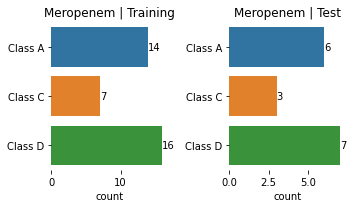

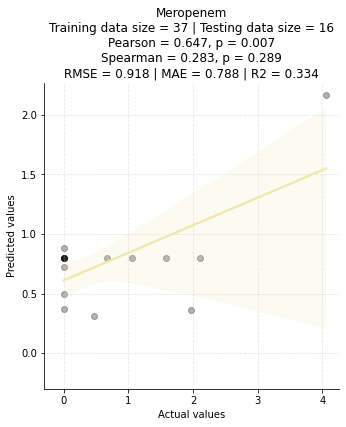

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Meropenem.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Cefuroxime using Prot-T5-BFD


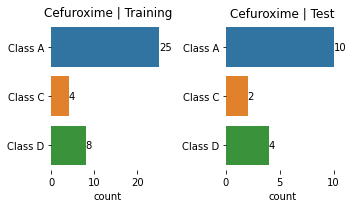

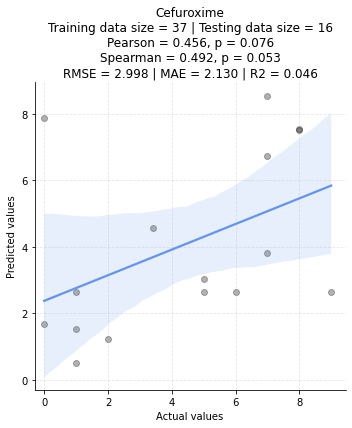

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Cefuroxime.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Cefpirome using Prot-T5-BFD


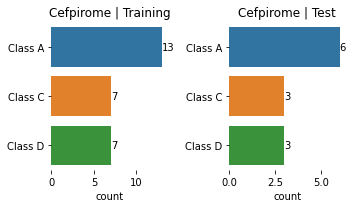

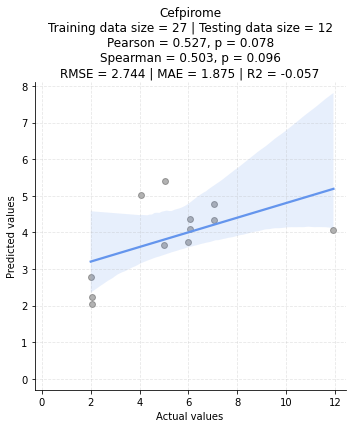

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Cefpirome.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Moxalactam using Prot-T5-BFD


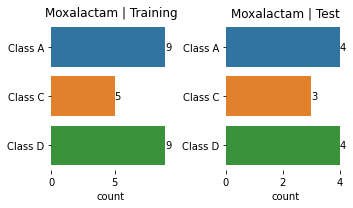

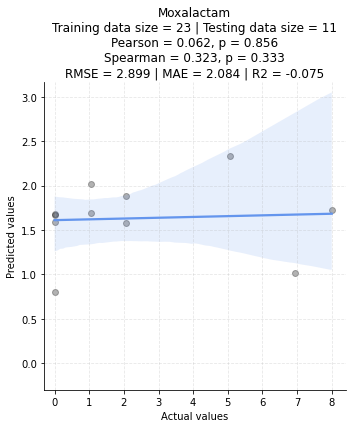

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Moxalactam.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕


🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀🦀
         Starting analysis for Ampicillin using Prot-T5-BFD


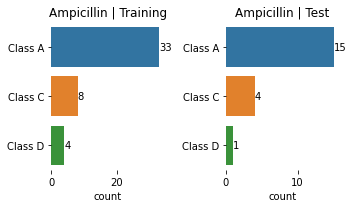

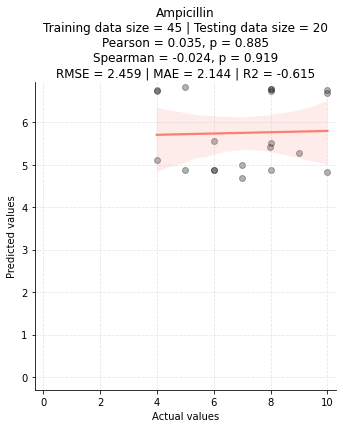

Model saved at: /home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/NuSVR_t5bfd_Ampicillin.sav
🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕🦕




In [23]:
# to collect data 
anti_lst       = []
rmse_lst       = []
mae_lst        = []
r2_lst         = []
pearson_lst    = []
p_pearson_lst  = []
spearman_lst   = []
p_spearman_lst = []
test_size_lst  = []
train_size_lst = []
data_size_lst  = []
mod_params_lst = []

# train a NuSVR per each antibiotic in SBL data 
for antibio in uniq_anti:
    
    # log
    print("\N{crab}"*29)
    print(f"         Starting analysis for {antibio} using Prot-T5-BFD")
    
    # retrive the data
    data = df[df["antibiotic"] == antibio]
    
    # split and sort
    training_data, testing_data = train_test_split(
        data, test_size=0.3, stratify=data["bla_class"], shuffle=True, random_state=22)
    training_data = training_data.sort_values("bla_class")
    testing_data  = testing_data.sort_values("bla_class")
    
    # plot proportions
    fig, axes = plt.subplots(1, 2, figsize=(5, 3))
        # training 
    ax1 = sns.countplot(data=training_data, y="bla_class", ax=axes[0])
    sns.despine(left=True, bottom=True)
    ax1.set_ylabel("")
    ax1.bar_label(ax1.containers[0])
    ax1.set_title(f"{antibio} | Training")
        # testing 
    ax2 = sns.countplot(data=testing_data, y="bla_class", ax=axes[1])
    ax2.set_ylabel("")
    ax2.bar_label(ax2.containers[0])
    ax2.set_title(f"{antibio} | Test")
        # adjust and show
    plt.tight_layout()
    plt.show()
    
    # set xs and ys
    X_train = np.array([np.array(x) for x in training_data["t5bfd"]])
    X_test  = np.array([np.array(x) for x in testing_data["t5bfd"]])
    y_train = training_data["log2_fold"].values
    y_test  = testing_data["log2_fold"].values
    
    # cv 
    cv = KFold(n_splits = 5, shuffle = True)
    
    # set regressor and its params space to optimize 
    regressor = NuSVR()
    param_search = {
            "kernel": ["rbf"],
            "gamma" : [1e-3, 1e-2, 0.1, 1, 10, 100, 1000, 10000],
            "nu"    : [0.01, 0.05, 0.1, 0.3, 0.5, 0.7, 0.9, 0.95],
            "C"     : [1e-3, 0.01, 0.1, 1, 10, 100, 1000, 10000]
    }
    
    # applying CV with a gridsearch on the training data to find the best model
    gs = GridSearchCV(estimator = regressor, cv = cv, param_grid = param_search, n_jobs=-1)
    gs.fit(X_train, y_train)
    
    # re-training with the best params
    best_model = NuSVR(**gs.best_params_)
    best_model.fit(X_train, y_train)
    
    # do preds on test set
    y_pred = np.clip(best_model.predict(X_test), a_min=0, a_max=None)
    
    # performance metrics 
    mse           = mean_squared_error(y_test, y_pred)
    rmse          = np.sqrt(mse)
    mae           = mean_absolute_error(y_test, y_pred) 
    r2            = r2_score( y_test, y_pred)
    corr_spearman = spearmanr(y_test, y_pred)[0]
    p_spearman    = spearmanr(y_test, y_pred)[1]
    corr_pearson  = pearsonr( y_test, y_pred)[0]
    p_pearson     = pearsonr( y_test, y_pred)[1]
    model_params  = best_model.get_params()
    
    # create a df with the data
    df_preds              = pd.DataFrame()
    df_preds["actual"]    = y_test
    df_preds["predicted"] = y_pred
        
    # plot
    if antibio in penicillins:
        color = "salmon"
    elif antibio in cephalosporins:
        color = "cornflowerblue"
    elif antibio in carbapenems:
        color = "palegoldenrod"
    elif antibio in monobactams:
        color = "palegreen"
        
    sns.lmplot(data = df_preds, x = "actual", y = "predicted",
               scatter_kws = {"color": "black", 'alpha':0.3}, 
               line_kws = {"color": color})
    plt.xlabel("Actual values")
    plt.ylabel("Predicted values")
    plt.grid(alpha = 0.3, linestyle = "--")
    plt.title("\n".join([
        f"{antibio}",
        f"Training data size = {len(X_train)} | Testing data size = {len(X_test)}",
        f"Pearson = {corr_pearson:.3f}, p = {p_pearson:.3f}",
        f"Spearman = {corr_spearman:.3f}, p = {p_spearman:.3f}",
        f"RMSE = {rmse:.3f} | MAE = {mae:.3f} | R2 = {r2:.3f}"]))
    plt.xlim(-0.3)
    plt.ylim(-0.3)
    plt.show()
    
    # append data
    anti_lst.append(antibio)
    rmse_lst.append(rmse)
    mae_lst.append(mae)
    r2_lst.append(r2)
    pearson_lst.append(corr_pearson)
    p_pearson_lst.append(p_pearson)
    spearman_lst.append(corr_spearman)
    p_spearman_lst.append(p_spearman)
    test_size_lst.append(len(X_test))
    train_size_lst.append(len(X_train))
    data_size_lst.append(len(data))
    mod_params_lst.append(model_params)
    
    # save the model 
    path = "/home/gama/bla_analysis/results/training/regression_models_inbalance_zero_lim/"
    filename = path + f"NuSVR_t5bfd_{antibio}.sav"
    joblib.dump(best_model, filename)
    print(f"Model saved at: {filename}")
    print("\N{Sauropod}"*29)
    print("\n")

In [24]:
! tree ../results/training/regression_models_inbalance_zero_lim/

../results/training/regression_models_inbalance_zero_lim/
├── NuSVR_t5bfd_Amoxicillin-CLA.sav
├── NuSVR_t5bfd_Amoxicillin.sav
├── NuSVR_t5bfd_Ampicillin.sav
├── NuSVR_t5bfd_Aztreonam.sav
├── NuSVR_t5bfd_Cefepime.sav
├── NuSVR_t5bfd_Cefotaxime-CLA.sav
├── NuSVR_t5bfd_Cefotaxime.sav
├── NuSVR_t5bfd_Cefoxitin.sav
├── NuSVR_t5bfd_Cefpirome.sav
├── NuSVR_t5bfd_Ceftazidime-CLA.sav
├── NuSVR_t5bfd_Ceftazidime.sav
├── NuSVR_t5bfd_Ceftriaxone.sav
├── NuSVR_t5bfd_Cefuroxime.sav
├── NuSVR_t5bfd_Cephalothin.sav
├── NuSVR_t5bfd_Imipenem.sav
├── NuSVR_t5bfd_Meropenem.sav
├── NuSVR_t5bfd_Moxalactam.sav
├── NuSVR_t5bfd_Piperacillin-TZB.sav
├── NuSVR_t5bfd_Piperacillin.sav
├── NuSVR_t5bfd_Ticarcillin-CLA.sav
└── NuSVR_t5bfd_Ticarcillin.sav

0 directories, 21 files


In [25]:
# create a df 
df_metrics = pd.DataFrame()
df_metrics["anti"]         = anti_lst  
df_metrics["params"]       = mod_params_lst  
df_metrics["rmse"]         = rmse_lst 
df_metrics["mae"]          = mae_lst
df_metrics["r2"]           = r2_lst 
df_metrics["pearson"]      = pearson_lst 
df_metrics["pearson_p"]    = p_pearson_lst 
df_metrics["spearman"]     = spearman_lst 
df_metrics["spearman_p"]   = p_spearman_lst 
df_metrics["data_size"]    = data_size_lst 
df_metrics["train_size"]   = train_size_lst 
df_metrics["test_size"]    = test_size_lst 
df_metrics["anti_lab"]     = df_metrics["anti"] + " " + "(" + df_metrics["data_size"].astype(str) + ")"
df_metrics = df_metrics.sort_values("data_size", ascending=True).reset_index(drop = True)

# save it
df_metrics.to_csv("../results/training/nusvr_metrics_inbalance_zero_lim.csv", index = False)

## Performance metrics 

In [26]:
# load it 
df_metrics = pd.read_csv("../results/training/nusvr_metrics_inbalance_zero_lim.csv")

# set antibiotic classes
penicillins = ["Amoxicillin","Ticarcillin","Piperacillin", "Piperacillin-TZB",
               "Amoxicillin-CLA","Ampicillin","Ticarcillin-CLA"]

cephalosporins = ["Cephalothin","Cefuroxime","Cefoxitin", "Ceftazidime", "Ceftriaxone","Cefotaxime",
                  "Ceftazidime-CLA", "Cefotaxime-CLA", "Cefepime", "Cefpirome", "Moxalactam"]

carbapenems = ["Imipenem","Meropenem"]

monobactams = ["Aztreonam"]

# add anti class
filters = [df_metrics.anti.str.contains('|'.join(penicillins)), 
           df_metrics.anti.str.contains('|'.join(cephalosporins)),
           df_metrics.anti.str.contains('|'.join(carbapenems)),
           df_metrics.anti.str.contains('|'.join(monobactams))]

values = ["Penicillins", "Cephalosporins", "Carbapenems", "Monobactams"]

df_metrics["anti_class"] = np.select(filters, values)
df_metrics.head(3)

,anti,params,rmse,mae,r2,pearson,pearson_p,spearman,spearman_p,data_size,train_size,test_size,anti_lab,anti_class
0,Ceftriaxone,"{'C': 10000, 'cache_size': 200, 'coef0': 0.0, ...",3.203743,2.324772,-0.614936,0.562935,0.090212,0.475619,0.164716,33,23,10,Ceftriaxone (33),Cephalosporins
1,Moxalactam,"{'C': 1, 'cache_size': 200, 'coef0': 0.0, 'deg...",2.898575,2.083731,-0.075393,0.062337,0.855522,0.322557,0.333325,34,23,11,Moxalactam (34),Cephalosporins
2,Cefpirome,"{'C': 10, 'cache_size': 200, 'coef0': 0.0, 'de...",2.743782,1.874512,-0.056647,0.527008,0.078311,0.502643,0.095811,39,27,12,Cefpirome (39),Cephalosporins


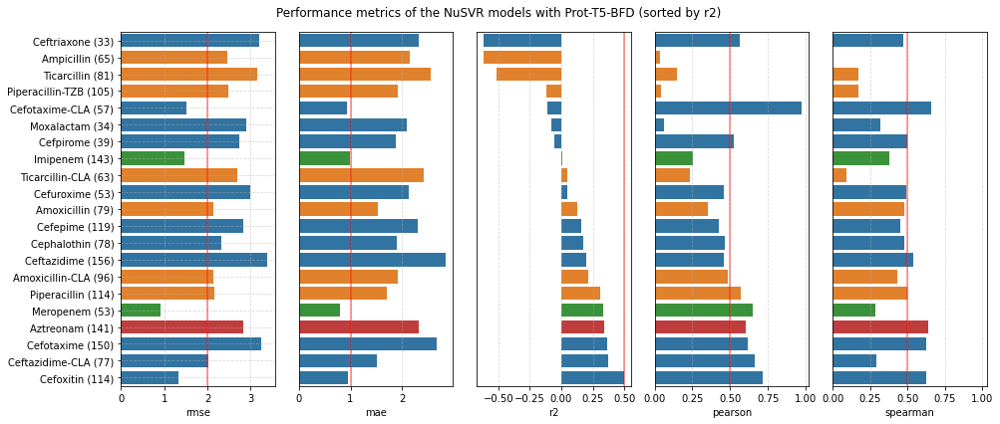

In [27]:
# set metrics to plot 
metrics = ['rmse', 'mae', 'r2', 'pearson', 'spearman']

# set the fig composition 
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(14, 6))

# Flatten the axes to iterate over them
axs = axs.flatten()  
for i, metric in enumerate(metrics):
    
    # add a line of reference 
    if metric == "rmse":
        ref = 2
    elif metric == "mae":
        ref = 1
    elif  metric == "r2":
        ref = 0.5
    elif  metric == "pearson":
        ref = 0.5
    elif  metric == "spearman":
        ref = 0.5
    
    # barplot
    sns.barplot(data = df_metrics.sort_values("r2"), y = "anti_lab", x = metric,
                hue = "anti_class", dodge=False, ax = axs[i])
    axs[i].set_ylabel("")
    axs[i].grid(alpha=0.5, linestyle="--")
    axs[i].axvline(ref, color="red", alpha=0.5)
    axs[i].legend().set_visible(False)
    if metric == "spearman":
        axs[i].set_xlim(0, 1.03)
    if metric != "rmse":
        axs[i].set_yticks([])
        
# hide the last panel because it has no data 
# axs[-1].axis("off")  

# add a title and adjus the plots
plt.suptitle("Performance metrics of the NuSVR models with Prot-T5-BFD (sorted by r2)")
plt.tight_layout()  
plt.show()

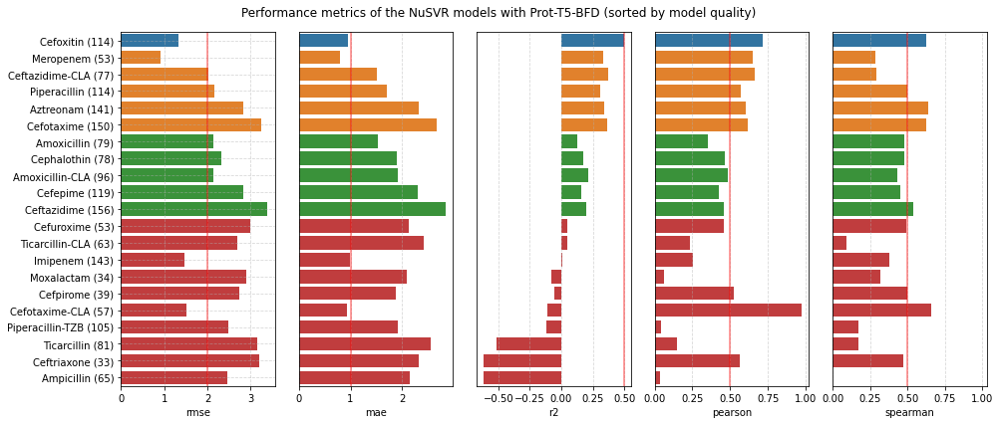

In [48]:
# create a copy and set the new order based on the model quality
df_metrics_sorted = df_metrics.copy()

qual_high = ["Cefoxitin"]

qual_med  = ["Meropenem", "Ceftazidime-CLA", "Piperacillin", "Aztreonam","Cefotaxime"]

qual_low  = ["Amoxicillin", "Cephalothin","Amoxicillin-CLA", "Cefepime","Ceftazidime"]

qual_tra  = ["Cefuroxime","Ticarcillin-CLA","Imipenem", "Moxalactam","Cefpirome",
            "Cefotaxime-CLA", "Piperacillin-TZB", "Ticarcillin", "Ceftriaxone", "Ampicillin"]

new_order = qual_high + qual_med + qual_low + qual_tra

# ordenar el DataFrame por la columna 'Antibiótico' en orden ascendente
df_metrics_sorted["anti"] = pd.Categorical(df_metrics_sorted["anti"], categories = new_order, ordered = True)
df_metrics_sorted = df_metrics_sorted.sort_values(by="anti")

# create a new col with the info of the qualiy
filters = [
    df_metrics_sorted.anti.isin(qual_high),
    df_metrics_sorted.anti.isin(qual_med),
    df_metrics_sorted.anti.isin(qual_low),
    df_metrics_sorted.anti.isin(qual_tra)
]
values = ["High", "Medium", "Low", "Trash"]
df_metrics_sorted["quality"] = np.select(filters, values)

##############
# same plot but sorted by model quality

# set the fig composition 
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(14, 6))

# Flatten the axes to iterate over them
axs = axs.flatten()  
for i, metric in enumerate(metrics):
    
    # add a line of reference 
    if metric == "rmse":
        ref = 2
    elif metric == "mae":
        ref = 1
    elif  metric == "r2":
        ref = 0.5
    elif  metric == "pearson":
        ref = 0.5
    elif  metric == "spearman":
        ref = 0.5
    
    # barplot
    sns.barplot(data = df_metrics_sorted, y = "anti_lab", x = metric, hue = "quality", dodge=False, ax = axs[i])
    axs[i].set_ylabel("")
    axs[i].grid(alpha=0.5, linestyle="--")
    axs[i].axvline(ref, color="red", alpha=0.5)
    axs[i].legend().set_visible(False)
    if metric == "spearman":
        axs[i].set_xlim(0, 1.03)
    if metric != "rmse":
        axs[i].set_yticks([])

# add a title and adjus the plots
plt.suptitle("Performance metrics of the NuSVR models with Prot-T5-BFD (sorted by model quality)")
plt.tight_layout()  
plt.show()

use RandomForestRegressor, xgboostregressor, ridgeregressor, SVR, bagginregressosr asi como esm1b y xlnet y ninguno se tradujo en r2 > 0.5

# Do predictions 

In [2]:
# load seqs annots
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

# load likelihoods from carp and merge dset
df_plm = pd.read_pickle("../results/embeddings/all_plm.pkl")
df_all = pd.merge(df_annot, df_plm, on = "seq_id")

# select SBL
df_sbl = df_all[df_all.bla_class.str.contains("Class A|Class C|Class D|Risso|Ancestral")]
df_sbl.bla_class.unique()

array(['Class A', 'Class C', 'Class D', 'Ancestral', 'Risso cons'],
      dtype=object)

In [3]:
# select the class a consensus
df_cons_a = df_all[df_all.bla_class.str.contains("Consensus")].head(1)

In [4]:
# concat the data 
df = pd.concat([df_sbl, df_cons_a], axis=0)
df.bla_class.unique()

array(['Class A', 'Class C', 'Class D', 'Ancestral', 'Risso cons',
       'Consensus'], dtype=object)

In [5]:
# retrive the t5bfd embeddings
t5bfd_sbl_embeddings = np.array([np.array(x) for x in df["t5bfd"]])

In [6]:
# print the availabloe models 
! tree ../results/training/regression_models/

../results/training/regression_models/
├── NuSVR_t5bfd_Amoxicillin-CLA.sav
├── NuSVR_t5bfd_Amoxicillin.sav
├── NuSVR_t5bfd_Ampicillin.sav
├── NuSVR_t5bfd_Aztreonam.sav
├── NuSVR_t5bfd_Cefepime.sav
├── NuSVR_t5bfd_Cefotaxime-CLA.sav
├── NuSVR_t5bfd_Cefotaxime.sav
├── NuSVR_t5bfd_Cefoxitin.sav
├── NuSVR_t5bfd_Cefpirome.sav
├── NuSVR_t5bfd_Ceftazidime-CLA.sav
├── NuSVR_t5bfd_Ceftazidime.sav
├── NuSVR_t5bfd_Ceftriaxone.sav
├── NuSVR_t5bfd_Cefuroxime.sav
├── NuSVR_t5bfd_Cephalothin.sav
├── NuSVR_t5bfd_Imipenem.sav
├── NuSVR_t5bfd_Meropenem.sav
├── NuSVR_t5bfd_Moxalactam.sav
├── NuSVR_t5bfd_Piperacillin-TZB.sav
├── NuSVR_t5bfd_Piperacillin.sav
├── NuSVR_t5bfd_Ticarcillin-CLA.sav
└── NuSVR_t5bfd_Ticarcillin.sav

0 directories, 21 files


In [5]:
# high quality models
model_cefoxitin        = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Cefoxitin.sav")

# medium quality models 
model_meropenem        = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Meropenem.sav")
model_ceftazidime_cla  = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Ceftazidime-CLA.sav")
model_piperacillin     = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Piperacillin.sav")
model_aztreonam        = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Aztreonam.sav")
model_cefotaxime       = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Cefotaxime.sav")

# low quality models 
model_amoxicillin      = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Amoxicillin.sav")
model_cephalothin      = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Cephalothin.sav")
model_amoxicillin_cla  = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Amoxicillin-CLA.sav")
model_cefepime         = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Cefepime.sav")
model_ceftazidime      = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Ceftazidime.sav")

# trash models
model_cefuroxime       = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Cefuroxime.sav")
model_ticarcillin_cla  = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Ticarcillin-CLA.sav")
model_imipenem         = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Imipenem.sav")
model_moxalactam       = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Moxalactam.sav")
model_cefpirome        = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Cefpirome.sav")
model_cefotaxime_cla   = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Cefotaxime-CLA.sav")
model_tiperacillin_tzb = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Piperacillin-TZB.sav")
model_ticarcillin      = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Ticarcillin.sav")
model_ceftriaxone      = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Ceftriaxone.sav")
model_ampicillin       = joblib.load("../results/training/regression_models/NuSVR_t5bfd_Ampicillin.sav")

In [7]:
model_cefoxitin.get_params()

{'C': 10,
 'cache_size': 200,
 'coef0': 0.0,
 'degree': 3,
 'gamma': 10,
 'kernel': 'rbf',
 'max_iter': -1,
 'nu': 0.3,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

In [8]:
# high quality models
preds_cefoxitin        = np.clip(model_cefoxitin.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)

# medium quality models 
preds_meropenem        = np.clip(model_meropenem.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_ceftazidime_cla  = np.clip(model_ceftazidime_cla.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_piperacillin     = np.clip(model_piperacillin.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_aztreonam        = np.clip(model_aztreonam.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_cefotaxime       = np.clip(model_cefotaxime.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)

# low quality models 
preds_amoxicillin      = np.clip(model_amoxicillin.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_cephalothin      = np.clip(model_cephalothin.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_amoxicillin_cla  = np.clip(model_amoxicillin_cla.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_cefepime         = np.clip(model_cefepime.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_ceftazidime      = np.clip(model_ceftazidime.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)

# trash models
preds_cefuroxime       = np.clip(model_cefuroxime.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_ticarcillin_cla  = np.clip(model_ticarcillin_cla.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_imipenem         = np.clip(model_imipenem.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_moxalactam       = np.clip(model_moxalactam.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_cefpirome        = np.clip(model_cefpirome.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_cefotaxime_cla   = np.clip(model_cefotaxime_cla.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_tiperacillin_tzb = np.clip(model_tiperacillin_tzb.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_ticarcillin      = np.clip(model_ticarcillin.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_ceftriaxone      = np.clip(model_ceftriaxone.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)
preds_ampicillin       = np.clip(model_ampicillin.predict(t5bfd_sbl_embeddings), a_min=0, a_max=None)

In [9]:
# create a df with predictions 
df_preds = pd.DataFrame()
df_preds["seq_id"]                     = df.seq_id

# high quality models
df_preds["predictions_cefoxitin"]       = preds_cefoxitin

# medium quality models
df_preds["predictions_meropenem"]       = preds_meropenem
df_preds["predictions_ceftazidime_cla"] = preds_ceftazidime_cla
df_preds["predictions_piperacillin"]    = preds_piperacillin
df_preds["predictions_aztreonam"]       = preds_aztreonam
df_preds["predictions_cefotaxime"]      = preds_cefotaxime

# low quality models
df_preds["predictions_amoxicillin"]      = preds_amoxicillin
df_preds["predictions_cephalothin"]      = preds_cephalothin
df_preds["predictions_amoxicillin_cla"]  = preds_amoxicillin_cla
df_preds["predictions_cefepime"]         = preds_cefepime
df_preds["predictions_ceftazidime"]      = preds_ceftazidime

# trash quality models
df_preds["predictions_cefuroxime"]       = preds_cefuroxime
df_preds["predictions_ticarcillin_cla"]  = preds_ticarcillin_cla
df_preds["predictions_imipenem"]         = preds_imipenem
df_preds["predictions_moxalactam"]       = preds_moxalactam
df_preds["predictions_cefpirome"]        = preds_cefpirome
df_preds["predictions_cefotaxime_cla"]   = preds_cefotaxime_cla
df_preds["predictions_tiperacillin_tzb"] = preds_tiperacillin_tzb
df_preds["predictions_ticarcillin"]      = preds_ticarcillin
df_preds["predictions_ceftriaxone"]      = preds_ceftriaxone
df_preds["predictions_ampicillin"]       = preds_ampicillin

In [10]:
# export data 
df_preds.to_csv("../results/training/high_and_medium_quality_model_predictions.csv", index = False)
df_preds

,seq_id,predictions_cefoxitin,predictions_meropenem,predictions_ceftazidime_cla,predictions_piperacillin,predictions_aztreonam,predictions_cefotaxime,predictions_amoxicillin,predictions_cephalothin,predictions_amoxicillin_cla,...,predictions_cefuroxime,predictions_ticarcillin_cla,predictions_imipenem,predictions_moxalactam,predictions_cefpirome,predictions_cefotaxime_cla,predictions_tiperacillin_tzb,predictions_ticarcillin,predictions_ceftriaxone,predictions_ampicillin
0,seq_0,1.424722,0.944299,1.240444,6.058846,4.725390,2.346697,6.738769,5.519438,3.837813,...,2.579889,4.188079,0.282308,1.649546,3.634859,1.220632,2.291583,6.474183,5.963538,5.949863
1,seq_1,1.424641,0.947778,1.250894,6.071375,4.760188,2.416066,6.740560,5.812985,3.837813,...,2.561343,4.188037,0.244299,1.649491,3.628632,1.199059,2.284644,6.484502,5.949382,5.960352
2,seq_2,1.424758,0.945438,1.278491,6.062391,4.680479,2.146196,6.747399,5.543038,3.837813,...,2.594266,4.188108,0.247910,1.649628,3.649356,1.194538,2.293602,6.474288,6.012128,5.910830
3,seq_3,1.424692,0.950801,1.345622,6.057465,4.866471,2.335605,6.747880,5.655198,3.837813,...,2.537797,4.188209,0.281157,1.649644,3.665141,1.161139,2.309253,6.483803,5.982299,5.822413
4,seq_4,1.424834,0.944703,1.278519,6.061715,4.707979,2.181706,6.745047,5.495416,3.837813,...,2.531856,4.188158,0.274813,1.649703,3.640083,1.228551,2.288626,6.468783,5.975492,5.936876
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25818,seq_25818,1.425279,0.974982,1.339364,6.705867,5.480557,4.190110,7.079429,5.215871,3.837813,...,5.035487,4.186730,0.000000,1.649906,4.172572,0.655725,1.895625,6.736830,7.441196,6.368089
25819,seq_25819,1.425474,1.000706,1.118694,6.599778,5.965226,5.201806,7.053466,6.516847,3.837813,...,5.726415,4.186649,0.395055,1.649944,4.202481,0.832531,1.879839,6.700398,7.605597,6.304148
25820,seq_25820,1.426092,1.018206,0.975095,6.581753,5.853831,4.798311,7.057451,6.360238,3.837813,...,5.832813,4.185426,0.744329,1.649557,4.279855,0.717800,1.911558,6.756748,7.840477,6.324636
26022,seq_26022,1.425379,0.860977,2.715013,6.187412,4.688563,5.201295,6.697094,5.923587,3.837813,...,3.357422,4.187982,0.000000,1.650207,3.905240,1.795129,2.276074,6.368469,6.188189,5.919351


# preds analysis

## cluster preds  

In [2]:
# load data
df_preds = pd.read_csv("../results/training/high_and_medium_quality_model_predictions.csv")

# load seqs annots
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

# load tsne coords and merge annots
df_tsne = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_sbl_esm1b.csv")
df_sbl = df_tsne.merge(df_annot, on = "seq_id")

# merge preds
df_sbl_preds = pd.merge(df_sbl, df_preds, on = "seq_id")
df_sbl_preds.columns

Index(['tSNE1_esm1b', 'tSNE2_esm1b', 'seq_id', '#name', 'seq', 'length',
       'filename', 'protein_name', 'protein_family', 'bla_class',
       'bla_subclass', 'protein_family_header', 'molecular_weight',
       'aromaticity', 'instability', 'gravy', 'isoelectric_point', 'entropy',
       'helix', 'turn', 'sheet', 'is_clust90_rep', 'bitscore', 'Domain',
       'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species',
       'predicted_signal_peptide', 'Other_sigpept', 'SP(Sec/SPI)',
       'LIPO(Sec/SPII)', 'TAT(Tat/SPI)', 'TATLIPO(Sec/SPII)',
       'PILIN(Sec/SPIII)', 'CS Position', 'seq_without_sigpept',
       'predictions_cefoxitin', 'predictions_meropenem',
       'predictions_ceftazidime_cla', 'predictions_piperacillin',
       'predictions_aztreonam', 'predictions_cefotaxime',
       'predictions_amoxicillin', 'predictions_cephalothin',
       'predictions_amoxicillin_cla', 'predictions_cefepime',
       'predictions_ceftazidime', 'predictions_cefuroxime',
       'predictions

In [3]:
qual_high = ["Cefoxitin"]

qual_med  = ["Meropenem", "Ceftazidime-CLA", "Piperacillin", "Aztreonam","Cefotaxime"]

qual_low  = ["Amoxicillin", "Cephalothin","Amoxicillin-CLA", "Cefepime","Ceftazidime"]

qual_tra  = ["Cefuroxime","Ticarcillin-CLA","Imipenem", "Moxalactam","Cefpirome",
            "Cefotaxime-CLA", "Piperacillin-TZB", "Ticarcillin", "Ceftriaxone", "Ampicillin"]

/home/gama/anaconda3/envs/bioem/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 0.98, 'High, medium and low \nquality models')

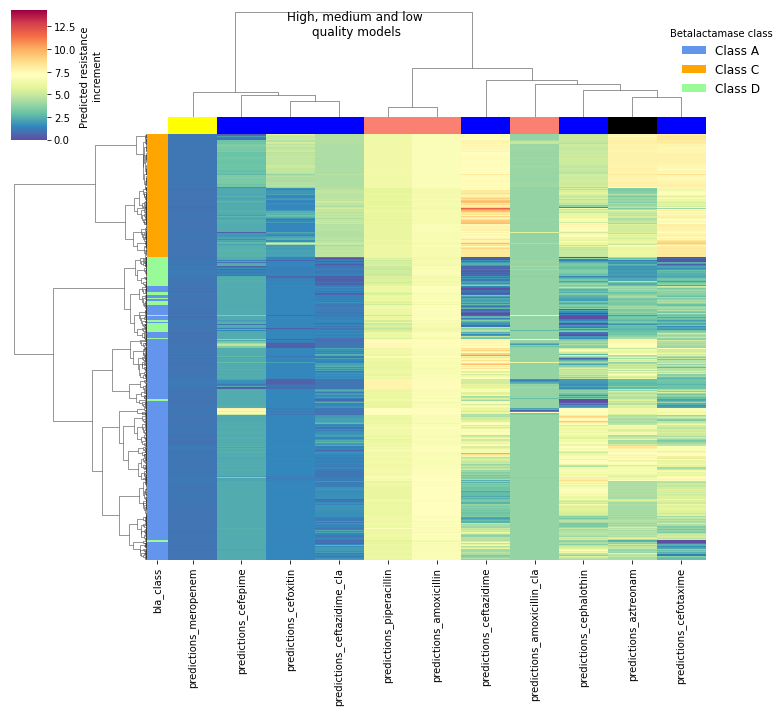

In [5]:
df_sbl_preds_nocons = df_sbl_preds[df_sbl_preds.bla_class.str.contains("Class A|Class C|Class D")]

df_cluster = df_sbl_preds_nocons[[
    'predictions_cefoxitin',
    'predictions_meropenem',
    'predictions_ceftazidime_cla',
    'predictions_piperacillin',
    'predictions_aztreonam',
    'predictions_cefotaxime',
    'predictions_amoxicillin',
    'predictions_cephalothin',
    'predictions_amoxicillin_cla',
    'predictions_cefepime',
    'predictions_ceftazidime'
]]

jaja = [
    "blue",
    "yellow",
    "blue",
    "salmon",
    "black",
    "blue",
    "salmon",
    "blue",
    "salmon",
    "blue",
    "blue"
]

df_cluster_num = df_cluster.select_dtypes(['number'])

bla_colors = df_sbl_preds_nocons.bla_class.map({
    'Class A':"cornflowerblue", 
    'Class C':"orange", 
    'Class D':"palegreen"
})

# create a color palette and handles
lut = dict(zip(df_sbl_preds_nocons.bla_class.to_list(), bla_colors))
handles = [Patch(facecolor = lut[name]) for name in lut]

sns.clustermap(
    data=df_cluster_num, method = "ward", metric = "euclidean", standard_scale=None,
    cmap = "Spectral_r", xticklabels = True, yticklabels = False,
    row_colors=bla_colors, col_colors= jaja, cbar_kws={"label": "Predicted resistance \nincrement"})

plt.legend(
        handles, lut, 
        title = "Betalactamase class", loc = "upper left", 
        frameon = False, ncol = 1,
        bbox_to_anchor = (.92, .97), 
        bbox_transform = plt.gcf().transFigure, 
        prop = {'size': 12}) 
plt.suptitle("High, medium and low \nquality models")

/home/gama/anaconda3/envs/bioem/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 0.98, 'High and medium \nquality models')

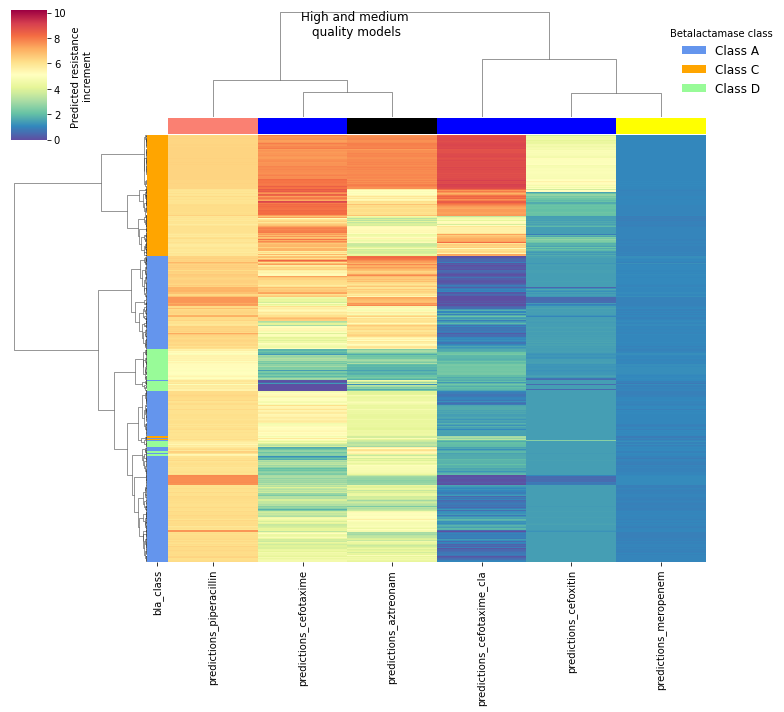

In [6]:
df_sbl_preds_nocons = df_sbl_preds[df_sbl_preds.bla_class.str.contains("Class A|Class C|Class D")]

df_cluster = df_sbl_preds_nocons[[
    'predictions_cefoxitin','predictions_cefotaxime', 'predictions_cefotaxime_cla',
    'predictions_meropenem',                    
    'predictions_piperacillin', 
    'predictions_aztreonam'
]]

jaja = [
    "blue","blue","blue",
    "yellow",
    "salmon",
    "black"
]

df_cluster_num = df_cluster.select_dtypes(['number'])

bla_colors = df_sbl_preds_nocons.bla_class.map({
    'Class A':"cornflowerblue", 
    'Class C':"orange", 
    'Class D':"palegreen"
})

# create a color palette and handles
lut = dict(zip(df_sbl_preds_nocons.bla_class.to_list(), bla_colors))
handles = [Patch(facecolor = lut[name]) for name in lut]

sns.clustermap(
    data=df_cluster_num, method = "ward", metric = "euclidean", standard_scale=None,
    cmap = "Spectral_r", xticklabels = True, yticklabels = False,
    row_colors=bla_colors, col_colors= jaja, cbar_kws={"label": "Predicted resistance \nincrement"})

plt.legend(
        handles, lut, 
        title = "Betalactamase class", loc = "upper left", 
        frameon = False, ncol = 1,
        bbox_to_anchor = (.92, .97), 
        bbox_transform = plt.gcf().transFigure, 
        prop = {'size': 12}) 
plt.suptitle("High and medium \nquality models")

## distro

In [7]:
# select the high and medium qual antibiotcis 
antibiotics = [
    # ceph
    'predictions_cefoxitin',
    'predictions_cefotaxime', 
    'predictions_cefotaxime_cla',
    # carba
    'predictions_meropenem',
    # peni
    "predictions_piperacillin",
    # mono
    'predictions_aztreonam'
]

high_quality = ['predictions_cefoxitin']

medium_quality = [
    'predictions_cefotaxime', 'predictions_cefotaxime_cla','predictions_meropenem',
    "predictions_piperacillin",'predictions_aztreonam' ] 

print(f"ceph  = {antibiotics[0:3]}\n")
print(f"carba = {antibiotics[-3]}\n")
print(f"peni  = {antibiotics[-2]}\n")
print(f"mono  = {antibiotics[-1]}\n")

ceph  = ['predictions_cefoxitin', 'predictions_cefotaxime', 'predictions_cefotaxime_cla']

carba = predictions_meropenem

peni  = predictions_piperacillin

mono  = predictions_aztreonam



In [8]:
df_lst = []

for ele in antibiotics:
    dataset = df_sbl_preds[[
        'tSNE1_esm1b', 'tSNE2_esm1b', 
        'seq_id','protein_name', 'bla_class', 'protein_family_header',
        ele
    ]].copy()
    
    if ele in antibiotics[0:3]:
        dataset.loc[:, "antibiotic_class"] = "Cephalosporins"
    elif ele in antibiotics[-3]:
        dataset.loc[:, "antibiotic_class"] = "Meropenem (Carbapenem)"
    elif ele in antibiotics[-2]:
        dataset.loc[:, "antibiotic_class"] = "Piperacillin (Penicillin)"
    elif ele in antibiotics[-1]:
        dataset.loc[:, "antibiotic_class"] = "Aztreonam (Monobactam)"
    
    if ele in high_quality:
        dataset.loc[:, "model_quality"] = "High"
    elif ele in medium_quality:
        dataset.loc[:, "model_quality"] = "Medium"
        
    dataset["antibiotic"] = str(ele)
    dataset = dataset.rename(columns={ele:"resistance_increment"})
    df_lst.append(dataset)

df_sbl_antibiotics = pd.concat(df_lst, axis=0)

df_sbl_antibiotics_nocons = df_sbl_antibiotics[df_sbl_antibiotics.bla_class.str.contains("Class A|Class C|Class D")]
df_sbl_antibiotics_nocons.head()

,tSNE1_esm1b,tSNE2_esm1b,seq_id,protein_name,bla_class,protein_family_header,resistance_increment,antibiotic_class,model_quality,antibiotic
1,-0.283795,-13.681005,seq_0,ACI-1,Class A,ACI,1.424722,Cephalosporins,High,predictions_cefoxitin
2,-0.266154,-13.693493,seq_1,ACI-2,Class A,ACI,1.424641,Cephalosporins,High,predictions_cefoxitin
3,-0.262226,-13.693281,seq_2,ACI-3,Class A,ACI,1.424758,Cephalosporins,High,predictions_cefoxitin
4,-0.344596,-13.637093,seq_3,ACI-4,Class A,ACI,1.424692,Cephalosporins,High,predictions_cefoxitin
5,-0.291932,-13.676996,seq_4,ACI-5,Class A,ACI,1.424834,Cephalosporins,High,predictions_cefoxitin


In [129]:
df_sbl_antibiotics_nocons[~df_sbl_antibiotics_nocons.antibiotic.str.contains("predictions_cefotaxime_cla")].antibiotic.unique()

array(['predictions_cefoxitin', 'predictions_cefotaxime',
       'predictions_meropenem', 'predictions_piperacillin',
       'predictions_aztreonam'], dtype=object)

Text(0.5, 0, '')

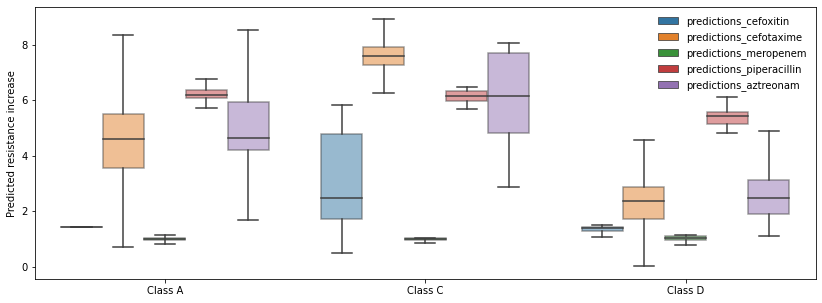

In [20]:
plt.figure(figsize=(14,5))
ax = sns.boxplot(
    data = df_sbl_antibiotics_nocons[~df_sbl_antibiotics_nocons.antibiotic.str.contains("predictions_cefotaxime_cla")], 
    x = "bla_class" , y = "resistance_increment", hue = "antibiotic", showfliers=False,
    boxprops=dict(alpha=0.5))
plt.legend(ncol = 1, loc = "best", frameon = False)
plt.ylabel("Predicted resistance increase")
plt.xlabel("")

Text(0.5, 0, '')

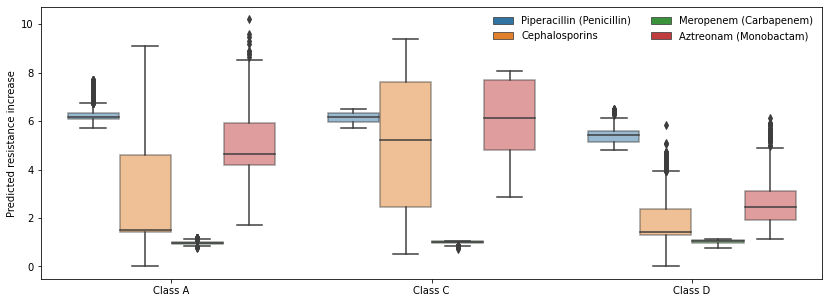

In [13]:
plt.figure(figsize=(14,5))
ax = sns.boxplot(
    data = df_sbl_antibiotics_nocons[~df_sbl_antibiotics_nocons.antibiotic.str.contains("predictions_cefotaxime_cla")], 
    x = "bla_class" , y = "resistance_increment", hue = "antibiotic_class", showfliers=True,
    hue_order = [
        "Piperacillin (Penicillin)", "Cephalosporins", 
        "Meropenem (Carbapenem)", "Aztreonam (Monobactam)"],
    boxprops=dict(alpha=0.5))
plt.legend(ncol = 2, loc = "best", frameon = False)
plt.ylabel("Predicted resistance increase")
plt.xlabel("")

Text(0.5, 0, '')

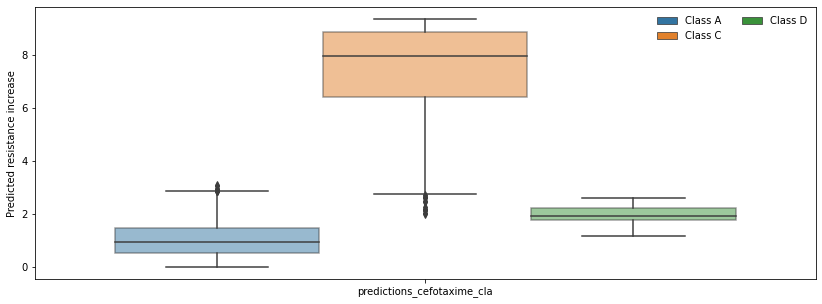

In [14]:
plt.figure(figsize=(14,5))
ax = sns.boxplot(
    data = df_sbl_antibiotics_nocons[df_sbl_antibiotics_nocons.antibiotic.str.contains("predictions_cefotaxime_cla")], 
    x = "antibiotic" , y = "resistance_increment", hue = "bla_class", showfliers=True,
    boxprops=dict(alpha=0.5))
plt.legend(ncol = 2, loc = "best", frameon = False)
plt.ylabel("Predicted resistance increase")
plt.xlabel("")

## map

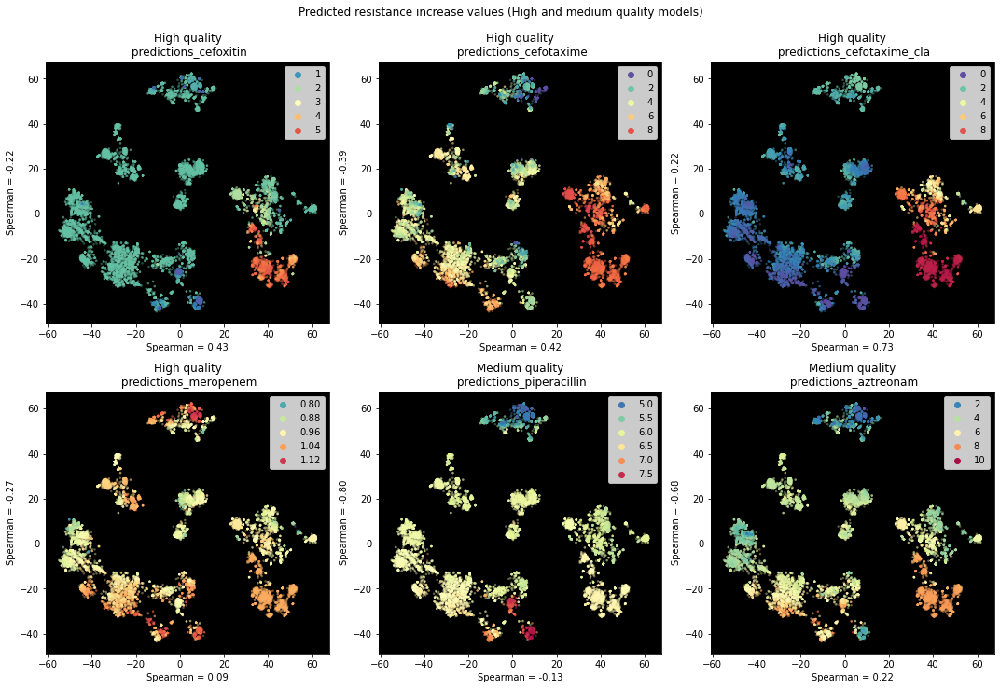

In [125]:
# select the models 
predictions = [
    # high qual
    'predictions_cefoxitin',
    # medium qual 
    'predictions_cefotaxime', 'predictions_cefotaxime_cla','predictions_meropenem',
    "predictions_piperacillin",'predictions_aztreonam'
]


# set figure composition
plt.figure(figsize=(15,15)) # 25,10

# per each panel
for idx, pred in enumerate(predictions):
    
    # create the axis
    ax = plt.subplot(3, 3, idx+1)
    ax.set_facecolor('black')
    
    # compute corrs
    spearman_x = spearmanr(df_sbl_preds.tSNE1_esm1b.to_list(), df_sbl_preds[pred].to_list())[0]
    spearman_y = spearmanr(df_sbl_preds.tSNE2_esm1b.to_list(), df_sbl_preds[pred].to_list())[0]
    
    
    # plot
    sns.scatterplot(
        data = df_sbl_preds.sort_values(pred, ascending=False), x = "tSNE1_esm1b", y = "tSNE2_esm1b", 
        hue = pred, alpha = 0.4, s = 5, palette = "Spectral_r", edgecolor = None, ax = ax)
    
    # set title and legend position
    if pred in predictions[0:4]:
        ax.set_title(f"High quality\n {pred}")
    else: 
        ax.set_title(f"Medium quality\n {pred}")
        
    plt.xlabel(f"Spearman = {spearman_x:.2f}")
    plt.ylabel(f"Spearman = {spearman_y:.2f}")    
        
    ax.legend(loc="upper right", frameon = True)
    #ax.spines['bottom'].set_color('darkblue')
    #ax.spines['top'].set_color('darkblue')
    #ax.spines['left'].set_color('darkblue')
    #ax.spines['right'].set_color('darkblue')
        
    plt.tight_layout()
    
# set title of the figure
plt.suptitle("Predicted resistance increase values (High and medium quality models)\n")
plt.tight_layout()

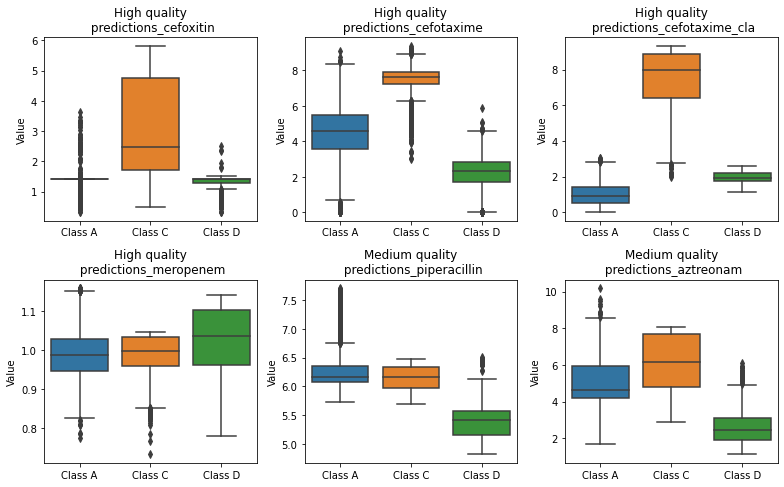

In [90]:
# set figure composition
plt.figure(figsize=(11,10)) # 25,10

# per each panel
for idx, pred in enumerate(predictions):
    
    # create the axis
    ax = plt.subplot(3, 3, idx+1)
    
    # plot
    sns.boxplot(
        data = df_sbl_preds[df_sbl_preds.bla_class.str.contains("Class A|Class C|Class D")], 
        x = "bla_class", y = pred, ax = ax)
    
    # set title and legend position
    # set title and legend position
    if pred in predictions[0:4]:
        ax.set_title(f"High quality\n {pred}")
    else: 
        ax.set_title(f"Medium quality\n {pred}")
        
    ax.set_ylabel("Value")
    ax.set_xlabel("")
    plt.tight_layout()
    
# set title of the figure
#plt.suptitle("Predicted resistance increase values (High and medium quality models)")
plt.tight_layout()

In [21]:
def do_iscatter(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 700, width = 900, color = annot,
    hover_name = "protein_name", 
    color_continuous_scale = px.colors.sequential.Turbo,
    hover_data = ["protein_family_header", 'bla_class'])

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()
    

In [22]:
do_iscatter(df_sbl_preds, "predictions_cefoxitin")

In [23]:
do_iscatter(df_sbl_preds[df_sbl_preds.bla_class.str.contains("Class A")], "predictions_cefoxitin")

## Taxonomy 

In [24]:
df_sbl_preds_tax = df_sbl_preds.copy()

df_sbl_preds_tax["Domain"]  = df_sbl_preds_tax.Domain.str.replace("d__", "")
df_sbl_preds_tax["Phylum"]  = df_sbl_preds_tax.Phylum.str.replace("p__", "")
df_sbl_preds_tax["Class"]   = df_sbl_preds_tax.Class.str.replace("c__", "")
df_sbl_preds_tax["Order"]   = df_sbl_preds_tax.Order.str.replace("o__", "")
df_sbl_preds_tax["Family"]  = df_sbl_preds_tax.Family.str.replace("f__", "")
df_sbl_preds_tax["Genus"]   = df_sbl_preds_tax.Genus.str.replace("g__", "")
df_sbl_preds_tax["Species"] = df_sbl_preds_tax.Species.str.replace("s__", "")


# taxonomic levels to plot
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']   

# take the top10 mos abundant taxonomic levels
for taxa in taxa_lst:
    top9 = list(df_sbl_preds_tax[taxa].value_counts()[:9].index)
    df_sbl_preds_tax.loc[~df_sbl_preds_tax[taxa].isin(top9), taxa] = "Other"

In [25]:
def plot_taxa_resistance(antibiotic_preds):
    # set figure composition
    plt.figure(figsize=(12,10)) # 25,10

    # per each panel
    for idx, tax in enumerate(taxa_lst):

        # create the axis
        ax = plt.subplot(3, 2, idx+1)

        # plot
        sns.boxplot(
            data = df_sbl_preds_tax, 
            y = tax, x = antibiotic_preds, showfliers=False, ax = ax)

        # set title and legend position
        ax.set_title(tax)
        ax.set_ylabel("Value")
        ax.set_xlabel("")
        plt.tight_layout()

    # set title of the figure
    plt.suptitle(antibiotic_preds)
    plt.tight_layout()

- https://www.frontiersin.org/articles/10.3389/fmicb.2020.01005/full
- https://www.ncbi.nlm.nih.gov/pmc/articles/PMC105504/
- https://www.sciencedirect.com/science/article/abs/pii/S0723202018302194?via%3Dihub
- https://gtdb.ecogenomic.org/taxon-history?from=R80&to=R214&query=s__Klebsiella%20aerogenes
- https://www.medigraphic.com/cgi-bin/new/resumen.cgi?IDARTICULO=40011

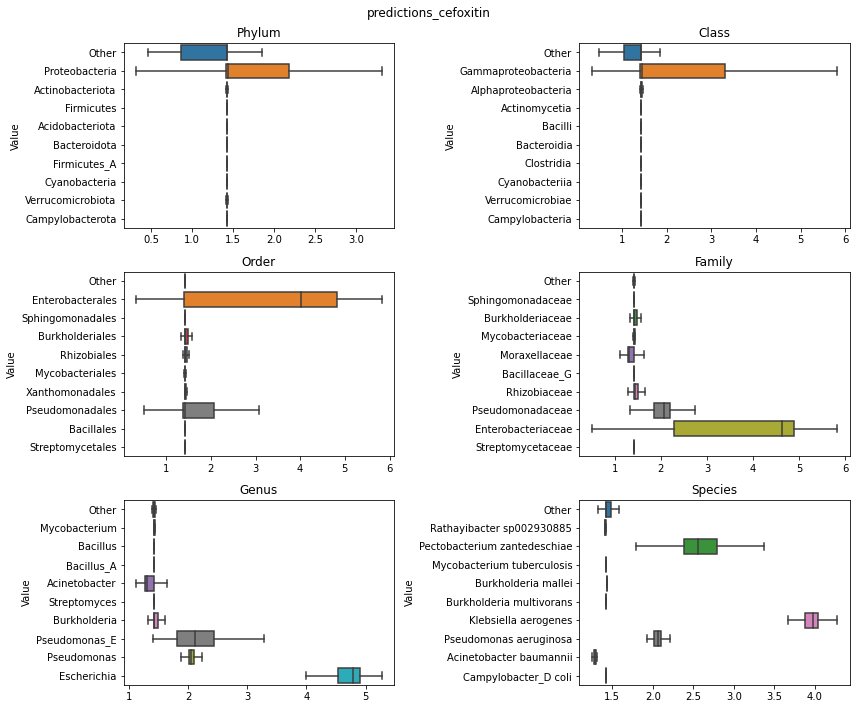

In [26]:
plot_taxa_resistance("predictions_cefoxitin")

In [116]:
predictions

['predictions_cefoxitin',
 'predictions_cefotaxime',
 'predictions_cefotaxime_cla',
 'predictions_meropenem',
 'predictions_piperacillin',
 'predictions_aztreonam']

## fams

In [175]:
df_sbl_preds.protein_family_header.nunique()

191

In [176]:
df_sbl_preds.predictions_cefoxitin.describe()

count    22685.000000
mean         1.883389
std          1.169172
min          0.313528
25%          1.422275
50%          1.425341
75%          1.506187
max          5.823181
Name: predictions_cefoxitin, dtype: float64

In [95]:
df_sbl_preds_fam = df_sbl_preds.copy()

# take the top10 mos abundant taxonomic levels
top18fam_a = list(df_sbl_preds_fam["protein_family_header"].value_counts()[:191].index)
df_sbl_preds_fam.loc[~df_sbl_preds_fam["protein_family_header"].isin(top18fam_a), "protein_family_header"] = 'No in top 20'
df_sbl_preds_fam.protein_family_header.nunique()

191

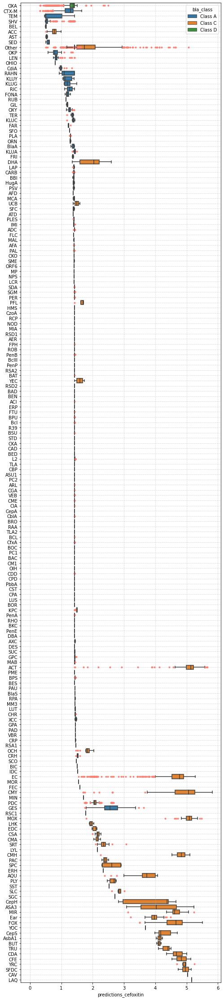

In [163]:
df_sbl_preds_fam_nocons = df_sbl_preds_fam[~df_sbl_preds_fam.protein_family_header.str.contains("Consensus|Risso cons|Ancestral")]

plt.figure(figsize=(8,40))
sns.boxplot(
    data = df_sbl_preds_fam_nocons.sort_values("predictions_cefoxitin"),
    y = "protein_family_header", x = "predictions_cefoxitin", hue="bla_class", dodge=False,
    hue_order= ["Class A","Class C", "Class D"],
    showfliers=True,
    flierprops={'marker': 'o', 'markersize': 3, 'markerfacecolor': "salmon", "markeredgecolor": "salmon" })
plt.ylabel("")
plt.xlim(-0.3)
plt.grid(alpha=0.5, linestyle="--");

In [238]:
fam = "TRU" 
if fam in top18fam_a:
    print("yes")
    
df_sbl_preds_fam[df_sbl_preds_fam.protein_family_header == fam]

yes


,tSNE1_esm1b,tSNE2_esm1b,seq_id,#name,seq,length,filename,protein_name,protein_family,bla_class,...,predictions_cefuroxime,predictions_ticarcillin_cla,predictions_imipenem,predictions_moxalactam,predictions_cefpirome,predictions_cefotaxime_cla,predictions_tiperacillin_tzb,predictions_ticarcillin,predictions_ceftriaxone,predictions_ampicillin
19768,33.403236,3.392633,seq_22897,gi|157933073|gb|ABW05394.1|TRU-1| class C beta...,MKQRIALSLLALGPLLLVPRVYAAADEPMANIVEKAVQPLLEEYRI...,382,C-TRU-1-prot.fasta,TRU-1,TRU,Class C,...,4.266653,4.188514,0.946213,3.527354,4.936962,7.871801,2.706088,5.386783,8.157729,5.249996
19769,33.065810,3.656442,seq_22898,WP_042073152.1|TRU-2| Aeromonas enteropelogenes,MKQRTALSLLALGPLLLVPRVYATADEPMASIVEKAVQPLLEEYRI...,382,C-TRU-2-prot.fasta,TRU-2,TRU,Class C,...,4.182454,4.188503,0.887932,3.337490,4.907772,7.795440,2.699609,5.382518,8.142959,5.251340
19770,33.270140,3.519241,seq_22899,WP_061475927.1|TRU-3| Aeromonas enteropelogenes,MKQRIALLLLALGPLLLVPRVYAAADEPMANIVEKAVQPLLEEYRI...,382,C-TRU-3-prot.fasta,TRU-3,TRU,Class C,...,4.129280,4.188497,0.875125,3.358279,4.907154,7.799275,2.698249,5.405554,8.087694,5.252369


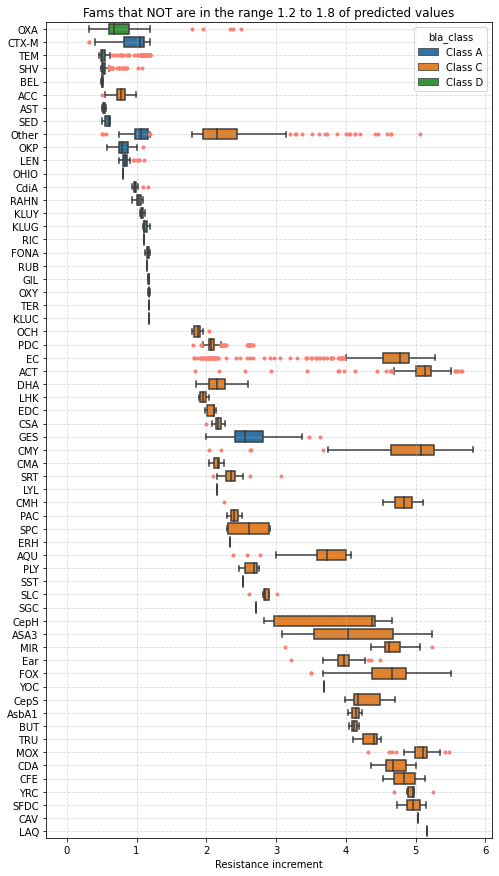

In [207]:
df_sbl_preds_fam_nocons = df_sbl_preds_fam[~df_sbl_preds_fam.protein_family_header.str.contains("Consensus|Risso cons|Ancestral")]
df_sbl_preds_fam_nocons = df_sbl_preds_fam_nocons[~df_sbl_preds_fam_nocons.predictions_cefoxitin.between(1.2,1.8)]

plt.figure(figsize=(8,15))
sns.boxplot(
    data = df_sbl_preds_fam_nocons.sort_values("predictions_cefoxitin"),
    y = "protein_family_header", x = "predictions_cefoxitin", hue="bla_class", dodge=False,
    showfliers=True, hue_order= ["Class A","Class C", "Class D"],
    flierprops={'marker': 'o', 'markersize': 3, 'markerfacecolor': "salmon", "markeredgecolor": "salmon" })
plt.ylabel("")
plt.xlim(-0.3)
plt.xlabel("Resistance increment")
plt.title("Fams that NOT are in the range 1.2 to 1.8 of predicted values")
plt.grid(alpha=0.5, linestyle="--");

number of fams with >10 variants = 73


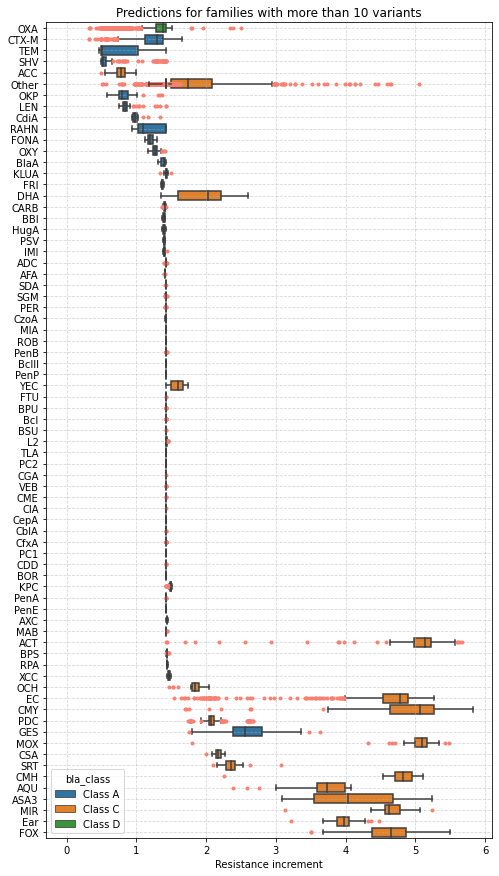

In [206]:
# get fam counts
fam_counts = df_sbl_preds_fam['protein_family_header'].value_counts()

# filter fams with more than >10 variants
selected_fams = fam_counts[fam_counts > 10].index.tolist()
print(f"number of fams with >10 variants = {len(selected_fams)}")

# filter the df based on selected_fams
filtered_df = df_sbl_preds_fam[df_sbl_preds_fam['protein_family_header'].isin(selected_fams)]

plt.figure(figsize=(8,15))
sns.boxplot(
    data = filtered_df.sort_values("predictions_cefoxitin"),
    y = "protein_family_header", x = "predictions_cefoxitin", hue="bla_class", dodge=False,
    showfliers=True,hue_order= ["Class A","Class C", "Class D"],
    flierprops={'marker': 'o', 'markersize': 3, 'markerfacecolor': "salmon", "markeredgecolor": "salmon" }
)
plt.ylabel("")
plt.xlim(-0.3)
plt.xlabel("Resistance increment")
plt.title("Predictions for families with more than 10 variants")
plt.grid(alpha=0.5, linestyle="--");

In [215]:
filtered_df_agg[filtered_df_agg.protein_family_header=="n < 10"]

,tSNE1_esm1b,tSNE2_esm1b,seq_id,#name,seq,length,filename,protein_name,protein_family,bla_class,...,predictions_cefuroxime,predictions_ticarcillin_cla,predictions_imipenem,predictions_moxalactam,predictions_cefpirome,predictions_cefotaxime_cla,predictions_tiperacillin_tzb,predictions_ticarcillin,predictions_ceftriaxone,predictions_ampicillin
0,-35.615970,-22.212238,seq_25809,cons_msa_all_class_a_filtSeqByLen_clust90_gapp...,MRRLLALALAAALARLAALERKGGRLGVAALDTTGRTVGYRADERF...,256,cons_msa_all_class_a_filtSeqByLen_clust90_gapp...,cons_msa_all_class_a_filtSeqByLen_clust90_gapp...,Consensus,"A, C and D",...,5.180605,4.188366,0.322438,1.649998,3.964591,1.159731,2.162214,6.453296,6.501982,6.354077
1,-0.283795,-13.681005,seq_0,gi|5596421|emb|CAB51471.1|ACI-1| class A exten...,MKKFCFLFLIICGLMVFCLQDCQARQKLNLADLENKYNAVIGVYAV...,284,A-ACI-1-prot.fasta,ACI-1,ACI,"A, C and D",...,2.579889,4.188079,0.282308,1.649546,3.634859,1.220632,2.291583,6.474183,5.963538,5.949863
2,-0.266154,-13.693493,seq_1,AHN92697.1|ACI-2| beta-lactamase [uncultured b...,MKKFCFLFLIICGLMFFCLQDCQARQKLNLADLENKYNAVIGVYAV...,284,A-ACI-2-prot.fasta,ACI-2,ACI,"A, C and D",...,2.561343,4.188037,0.244299,1.649491,3.628632,1.199059,2.284644,6.484502,5.949382,5.960352
3,-0.262226,-13.693281,seq_2,EHO64028.1|ACI-3| hypothetical protein HMPREF9...,MKKFCFLFLIICGLMVFSLQDCQARQKLNLADLENKYNAVIGVYAV...,284,A-ACI-3-prot.fasta,ACI-3,ACI,"A, C and D",...,2.594266,4.188108,0.247910,1.649628,3.649356,1.194538,2.293602,6.474288,6.012128,5.910830
4,-0.344596,-13.637093,seq_3,AHN92696.1|ACI-4| beta-lactamase [uncultured b...,MKKFCFLFLIICGLMVFCLQGCQARQKLNLADLENKYNAVIGVYAV...,284,A-ACI-4-prot.fasta,ACI-4,ACI,"A, C and D",...,2.537797,4.188209,0.281157,1.649644,3.665141,1.161139,2.309253,6.483803,5.982299,5.822413
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22680,-0.270373,-30.434637,seq_25816,ENCA,MHPQTLEQIKESESQLSGRVGMVELDLASGRTLSYRADERFPMMST...,263,ENCA,ENCA,Ancestral,"A, C and D",...,5.030580,4.182882,0.000000,1.649029,4.080303,0.168763,1.718427,6.829092,8.325759,6.407257
22681,-39.102330,-18.253770,seq_25817,GNCA,AAQLSEQLAELEKRSGGRLGVAVLDTATGRRIAYRGDERFPMCSTF...,262,GNCA,GNCA,Ancestral,"A, C and D",...,5.766637,4.187109,0.351846,1.649966,4.189076,0.812760,1.896408,6.689812,7.501504,6.290431
22682,-38.903748,-18.289371,seq_25818,GNCA-TEM-1-like,MAAQLSEQLAELEKRSGGRVGVIVLDTATGRRIAYRGDERFPMMST...,269,GNCA-TEM-1-like,GNCA-TEM-1-like,Ancestral,"A, C and D",...,5.035487,4.186730,0.000000,1.649906,4.172572,0.655725,1.895625,6.736830,7.441196,6.368089
22683,-39.032295,-18.264486,seq_25819,PNCA,AAALSEQLAELEKRSGGRLGVAVLDTATGRRIAYRGDERFPMCSTF...,262,PNCA,PNCA,Ancestral,"A, C and D",...,5.726415,4.186649,0.395055,1.649944,4.202481,0.832531,1.879839,6.700398,7.605597,6.304148


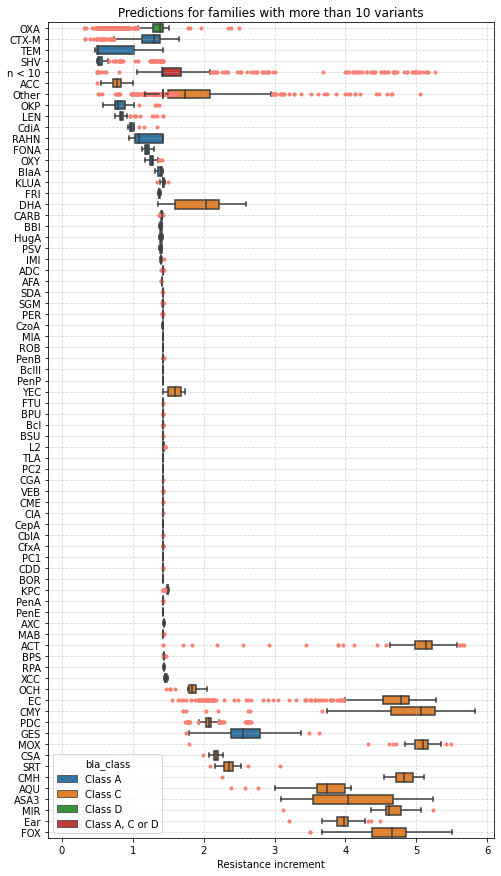

In [218]:
filtered_df_agg = df_sbl_preds_fam.copy()
filtered_df_agg.loc[~filtered_df_agg["protein_family_header"].isin(selected_fams), "protein_family_header"] = 'n < 10'
filtered_df_agg.loc[filtered_df_agg['protein_family_header'] == 'n < 10', 'bla_class'] = 'Class A, C or D'

plt.figure(figsize=(8,15))
sns.boxplot(
    data = filtered_df_agg.sort_values("predictions_cefoxitin"),
    y = "protein_family_header", x = "predictions_cefoxitin", hue="bla_class", dodge=False,
    showfliers=True,hue_order= ["Class A","Class C", "Class D", "Class A, C or D"],
    flierprops={'marker': 'o', 'markersize': 3, 'markerfacecolor': "salmon", "markeredgecolor": "salmon" }
)
plt.ylabel("")
plt.xlim(-0.2)
plt.xlabel("Resistance increment")
plt.title("Predictions for families with more than 10 variants")
plt.grid(alpha=0.5, linestyle="--");

/tmp/ipykernel_331/3145988276.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



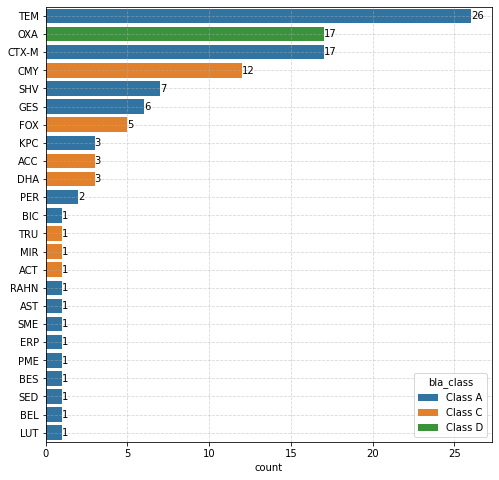

In [129]:
# we want to buld a df similar to the df with the mics data
df_mics_clean = pd.read_pickle("../results/mics/training_dset_mics_clean.pkl")

df_cefoxitin = df_mics_clean[~df_mics_clean.bla_class.str.contains("Class B")]
df_cefoxitin = df_cefoxitin[df_mics_clean.antibiotic == "Cefoxitin"]

plt.figure(figsize=(8,8))
ax = sns.countplot(data=df_cefoxitin, y="protein_family_header", hue="bla_class", dodge=False,
             order = pd.value_counts(df_cefoxitin.protein_family_header).index)
for num in [0,1,2]:
    ax.bar_label(ax.containers[num])
plt.grid(alpha=0.5, linestyle="--")
plt.ylabel("");

In [220]:
df_cefoxitin.protein_family_header.nunique()

24

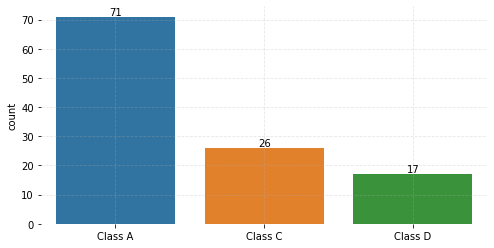

In [235]:
plt.figure(figsize=(8,4))
ax = sns.countplot(data=df_cefoxitin, x="bla_class", hue="bla_class", dodge=False)
for num in [0,1,2]:
    ax.bar_label(ax.containers[num])
plt.grid(alpha=0.3, linestyle="--")

plt.legend([], [], frameon=False)
sns.despine(left=True, bottom=True)
plt.xlabel("")
plt.xlabel("");

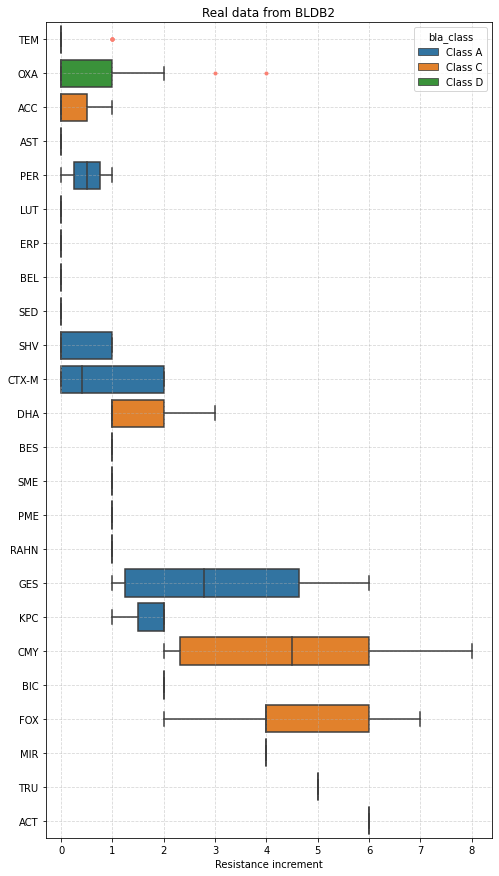

In [236]:
plt.figure(figsize=(8,15))
sns.boxplot(
    data = df_cefoxitin.sort_values("log2_fold"),
    y = "protein_family_header", x = "log2_fold", hue="bla_class", dodge=False,
      showfliers=True, hue_order= ["Class A","Class C", "Class D"],
    flierprops={'marker': 'o', 'markersize': 3, 'markerfacecolor': "salmon", "markeredgecolor": "salmon" })
plt.ylabel("")
plt.xlabel("Resistance increment")
plt.title("Real data from BLDB2")
plt.xlim(-0.3)
plt.grid(alpha=0.5, linestyle="--");

In [ ]:
data = df_cefoxitin.loc[df_cefoxitin['protein_family_header'] == 'xxx', 'bla_class']
cantidad_datos = len(data)

plt.figure(figsize=(8,15))
sns.boxplot(
    data = df_cefoxitin.sort_values("log2_fold"),
    y = "protein_family_header", x = "log2_fold", hue="bla_class", dodge=False,
      showfliers=True, hue_order= ["Class A","Class C", "Class D"],
    flierprops={'marker': 'o', 'markersize': 3, 'markerfacecolor': "salmon", "markeredgecolor": "salmon" })
plt.ylabel("")
plt.xlabel("Resistance increment")
plt.title("Real data from BLDB2")
plt.xlim(-0.3)
plt.grid(alpha=0.5, linestyle="--");

Fin